---
---

## Data Preparation

In [1]:
!pip install pyforest -q
import pyforest
import warnings
warnings.filterwarnings('ignore')

import yfinance as yf
from itertools import combinations

  Preparing metadata (setup.py) ... done


In [2]:
help(yf.download)

Help on function download in module yfinance.multi:

download(tickers, start=None, end=None, actions=False, threads=True, ignore_tz=None, group_by='column', auto_adjust=False, back_adjust=False, repair=False, keepna=False, progress=True, period='max', interval='1d', prepost=False, proxy=None, rounding=False, timeout=10, session=None)
    Download yahoo tickers
    :Parameters:
        tickers : str, list
            List of tickers to download
        period : str
            Valid periods: 1d,5d,1mo,3mo,6mo,1y,2y,5y,10y,ytd,max
            Either Use period parameter or use start and end
        interval : str
            Valid intervals: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
            Intraday data cannot extend last 60 days
        start: str
            Download start date string (YYYY-MM-DD) or _datetime, inclusive.
            Default is 99 years ago
            E.g. for start="2020-01-01", the first data point will be on "2020-01-01"
        end: str
            Downlo

In [3]:
'''

Here are a few examples of stocks that are known to have a negative correlation with each other:

1. [Gold Miners vs. Stock Market Indexes]
Newmont Corporation (NEM) vs. S&P 500 Index (SPY)

2. [Consumer Staples vs. Consumer Discretionary]
Procter & Gamble Co. (PG) vs. Amazon.com, Inc. (AMZN)

3. [Utilities vs. Technology]
NextEra Energy, Inc. (NEE) vs. Apple Inc. (AAPL)

4. [Healthcare vs. Financials]
Johnson & Johnson (JNJ) vs. JPMorgan Chase & Co. (JPM)

5. [Inverse ETFs]
ProShares Short S&P 500 (SH) vs. S&P 500 Index (SPY)


And here are a few examples of stocks that are known to have a positive correlation with each other:

6. [Tech Giants]
Apple Inc. (AAPL) and Microsoft Corporation (MSFT)

7. [Energy Sector]
Exxon Mobil Corporation (XOM) and Chevron Corporation (CVX)

8. [Financial Institutions]
JPMorgan Chase & Co. (JPM) and Bank of America Corporation (BAC)

9. [Consumer Discretionary]
Amazon.com, Inc. (AMZN) and Tesla, Inc. (TSLA)

10. [Retail]
Walmart Inc. (WMT) and Target Corporation (TGT)

'''

tickers = [
            "NEM", "SPY",           # these are some set of stocks known to have negative correlation
            "PG", "AMZN",
            "NEE", "AAPL",
            "JNJ", "JPM",
            "SH", "SPY",
            "AAPL", "MSFT",         # these are some set of stocks known to have positive correlation
            "XOM", "CVX",
            "JPM", "BAC",
            "AMZN", "TSLA",
            "WMT", "TGT"
          ]


pairs_for_observation = {
                          'neg1': ["NEM", "SPY"],
                          'neg2': ["PG", "AMZN"],
                          'neg3': ["NEE", "AAPL"],
                          'neg4': ["JNJ", "JPM"],
                          'neg5': ["SH", "SPY"],
                          'pos1': ["AAPL", "MSFT"],
                          'pos2': ["XOM", "CVX"],
                          'pos3': ["JPM", "BAC"],
                          'pos4': ["AMZN", "TSLA"],
                          'pos5': ["WMT", "TGT"]
                        }


print('Unique stocks:', len(set(tickers)))

data_yahoo = yf.download(tickers, period="2y", interval="1d")
data_yahoo.reset_index(inplace=True)
data_yahoo

Unique stocks: 16


[*********************100%%**********************]  16 of 16 completed


Price        Date   Adj Close                                                 \
Ticker                   AAPL        AMZN        BAC         CVX         JNJ   
0      2022-07-08  145.395020  115.540001  30.054443  132.296463  168.126434   
1      2022-07-11  143.249344  111.750000  29.742458  131.128906  168.192459   
2      2022-07-12  144.228241  109.220001  29.647919  128.728897  165.834808   
3      2022-07-13  143.862381  110.400002  29.156307  127.867134  165.448196   
4      2022-07-14  146.809036  110.629997  28.485069  125.967514  165.674500   
..            ...         ...         ...        ...         ...         ...   
497    2024-07-01  216.750000  197.199997  40.009998  156.520004  146.440002   
498    2024-07-02  220.270004  200.000000  40.930000  156.750000  146.029999   
499    2024-07-03  221.550003  197.589996  40.900002  156.710007  145.690002   
500    2024-07-05  226.339996  200.000000  40.410000  154.309998  146.479996   
501    2024-07-08  226.325607  199.699997  40.860001  154.630005  146.410004   

Price                                                 ...    Volume            \
Ticker         JPM        MSFT        NEE        NEM  ...      MSFT       NEE   
0       108.156799  263.039856  76.083427  54.877014  ...  19658800   5708300   
1       106.738174  259.944214  76.491096  54.350067  ...  19455200   6100400   
2       106.842201  249.291336  75.798996  53.564255  ...  35868500   7553900   
3       105.839691  248.357727  76.092896  53.795380  ...  29497400   7552400   
4       102.141800  249.694244  75.969643  50.837048  ...  25102800   6124400   
..             ...         ...        ...        ...  ...       ...       ...   
497     204.317856  456.730011  69.900002  41.650002  ...  17662800  11036400   
498     207.679230  459.279999  70.470001  41.709999  ...  13979800   9415200   
499     207.540009  460.769989  71.830002  43.450001  ...   9932800   4487200   
500     204.789993  467.559998  72.089996  44.509998  ...  15980200   7688800   
501     205.557495  465.770996  72.004997  43.974998  ...   3939490    902818   

Price                                                                        \
Ticker       NEM       PG        SH       SPY      TGT       TSLA       WMT   
0        3516400  4294200  29675000  72397800  2544900  101854200  14751000   
1        4106300  5482900  33881400  58366900  2050800   99241200  11532900   
2        4886200  5204400  32170900  62219200  3132800   87930900  13732200   
3        5534400  5075600  39219700  84224600  2769000   97954500  12689100   
4       10717600  4867000  41935700  89704800  2976000   78557400  20905500   
..           ...      ...       ...       ...      ...        ...       ...   
497      4457300  7638600  20852400  40297800  2638900  135691400   8666000   
498      6301100  5449200  16327500  40434800  3296400  205047900   9436500   
499      5732500  2980500   9810100  32789900  1633300  166561500   6287500   
500     10349600  6506500  13411800  41381300  3561800  154170000  21582600   
501      1666074  1372202   3178297   7758998  1593479   55797473   3417231   

Price             
Ticker       XOM  
0       17673800  
1       15603800  
2       21013000  
3       19928600  
4       26343000  
..           ...  
497     11972900  
498     13326700  
499      7732900  
500     12628700  
501      3582803  

[502 rows x 97 columns]

In [4]:
data_yahoo.to_csv('data_yahoo_raw.csv', index=False)

In [5]:
# Reset the index to get the Date as a column
data_yahoo.reset_index(inplace=True)

# Select only the Date and Closing Price columns (Close) by using the multi-level column names
data_yahoo = data_yahoo[['Date', 'Close']]

# Flatten the column names
data_yahoo.columns = ['Date'] + [f"{col[1]}" for col in data_yahoo.columns[1:]]

# Ensure no negative prices
data_yahoo.loc[:, data_yahoo.columns != 'Date'] = data_yahoo.loc[:, data_yahoo.columns != 'Date'].applymap(lambda x: max(x, 0))

# Ensure 'Date' is in datetime format
data_yahoo['Date'] = pd.to_datetime(data_yahoo['Date'])

data_yahoo

<IPython.core.display.Javascript object>

,Date,AAPL,AMZN,BAC,CVX,JNJ,JPM,MSFT,NEE,NEM,PG,SH,SPY,TGT,TSLA,WMT,XOM
0,2022-07-08,147.039993,115.540001,31.790001,142.770004,178.279999,114.360001,267.660004,80.250000,59.360001,145.020004,16.010000,388.670013,147.990005,250.763336,41.799999,86.080002
1,2022-07-11,144.869995,111.750000,31.459999,141.509995,178.350006,112.860001,264.510010,80.680000,58.790001,146.039993,16.180000,384.230011,146.389999,234.343338,41.816666,85.639999
2,2022-07-12,145.860001,109.220001,31.360001,138.919998,175.850006,112.970001,253.669998,79.949997,57.939999,144.750000,16.340000,380.829987,144.559998,233.070007,41.689999,84.500000
3,2022-07-13,145.490005,110.400002,30.840000,137.990005,175.440002,111.910004,252.720001,80.260002,58.189999,145.699997,16.410000,378.829987,145.440002,237.039993,41.790001,84.839996
4,2022-07-14,148.470001,110.629997,30.129999,135.940002,175.679993,108.000000,254.080002,80.129997,54.990002,145.270004,16.469999,377.910004,146.289993,238.313339,42.606667,83.139999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,2024-07-01,216.750000,197.199997,40.009998,156.520004,146.440002,205.449997,456.730011,69.900002,41.650002,162.720001,11.390000,545.340027,145.740005,209.860001,67.480003,114.959999
498,2024-07-02,220.270004,200.000000,40.930000,156.750000,146.029999,208.830002,459.279999,70.470001,41.709999,163.899994,11.320000,549.010010,145.389999,231.259995,68.070000,114.180000
499,2024-07-03,221.550003,197.589996,40.900002,156.710007,145.690002,208.690002,460.769989,71.830002,43.450001,163.830002,11.280000,551.460022,144.800003,246.389999,68.239998,114.760002
500,2024-07-05,226.339996,200.000000,40.410000,154.309998,146.479996,204.789993,467.559998,72.089996,44.509998,165.210007,11.210000,554.640015,145.649994,251.520004,70.040001,113.370003


In [6]:
data_yahoo.describe()

,Date,AAPL,AMZN,BAC,CVX,JNJ,JPM,MSFT,NEE,NEM,PG,SH,SPY,TGT,TSLA,WMT,XOM
count,502,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000
mean,2023-07-06 18:27:15.059760896,170.452581,133.371136,32.688088,159.859124,161.110378,149.889039,324.819365,71.738317,42.370070,149.780857,14.247859,440.309074,148.512849,213.856501,52.165315,106.962789
min,2022-07-08 00:00:00,125.019997,81.820000,25.170000,135.940002,144.380005,101.959999,214.250000,49.320000,29.860001,123.760002,11.205000,356.559998,105.010002,108.099998,40.660000,83.139999
25%,2023-01-05 06:00:00,153.432499,105.702503,29.134999,153.649998,154.879997,132.895004,258.597488,62.757500,39.072500,144.407505,13.012500,399.974998,134.535000,179.822506,47.531668,102.547497
50%,2023-07-08 12:00:00,172.690002,129.784996,33.065001,158.990005,160.784996,143.049995,326.354996,73.695000,42.070002,150.040001,14.440000,429.800003,151.860001,207.390007,51.510000,107.244999
75%,2024-01-04 18:00:00,185.582497,153.402504,35.480000,166.317501,166.272499,169.925003,378.790001,78.327501,45.389998,155.997498,15.410000,474.907494,163.307507,250.217503,54.764167,113.317499
max,2024-07-08 00:00:00,226.339996,200.000000,40.930000,188.050003,180.250000,208.830002,467.559998,91.000000,59.360001,168.559998,17.299999,555.424988,181.020004,309.320007,70.040001,122.199997
std,NaN,19.837008,30.822812,3.779375,10.386559,8.880680,26.648495,67.125550,10.057008,5.209345,9.263403,1.471091,49.696740,17.973932,45.075641,6.214125,8.069359


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

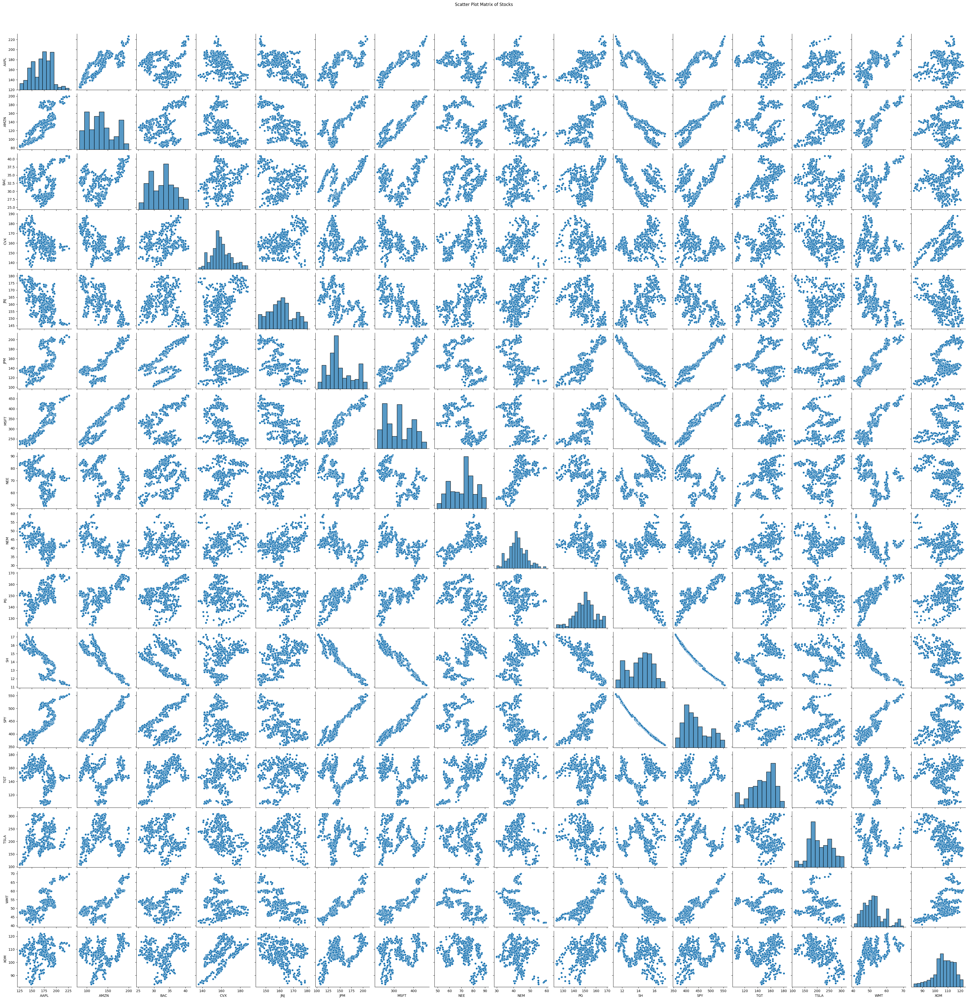

In [7]:
# Drop the 'Date' column for scatter plot matrix
data_yahoo_nodate = data_yahoo.drop(columns=['Date'])

# Plotting scatterplot matrix using seaborn
sns.pairplot(data_yahoo_nodate)
plt.suptitle('Scatter Plot Matrix of Stocks', y=1.02)
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

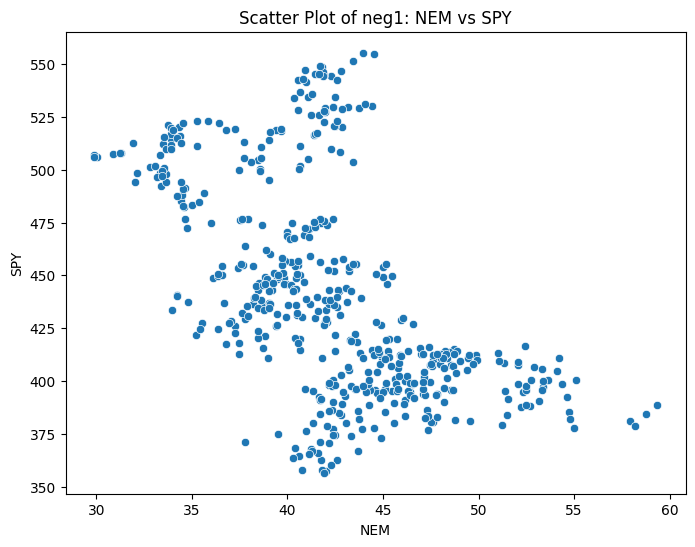

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

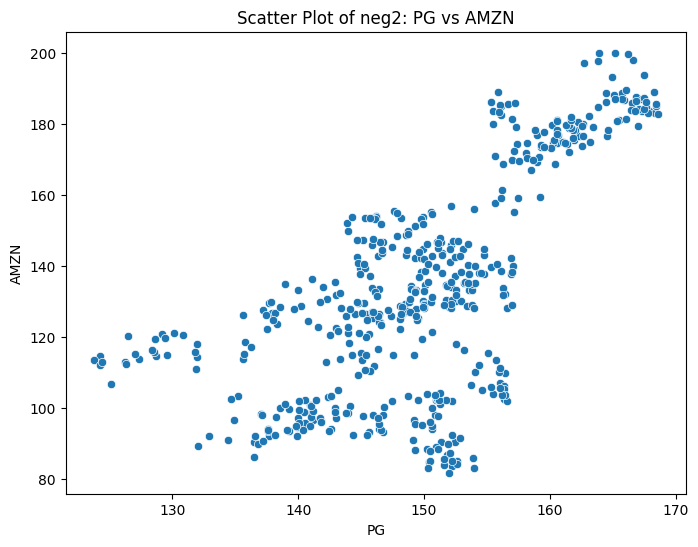

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

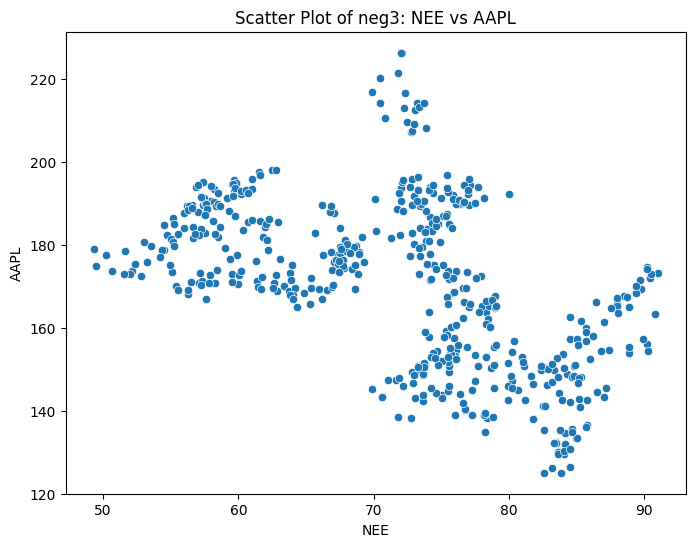

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

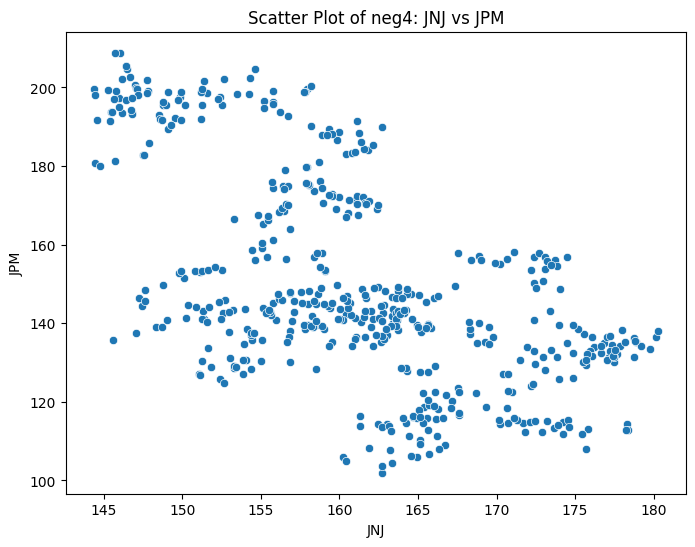

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

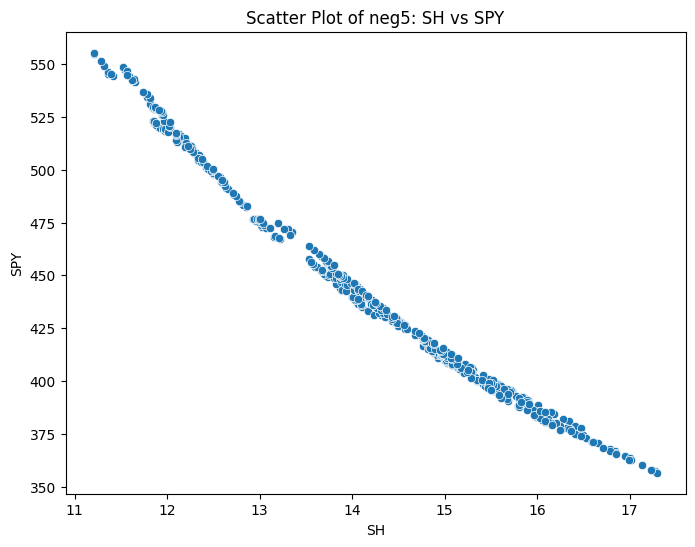

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

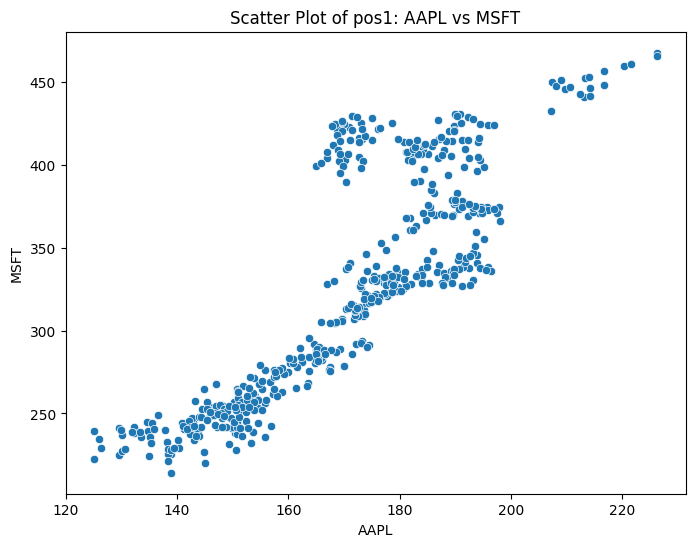

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

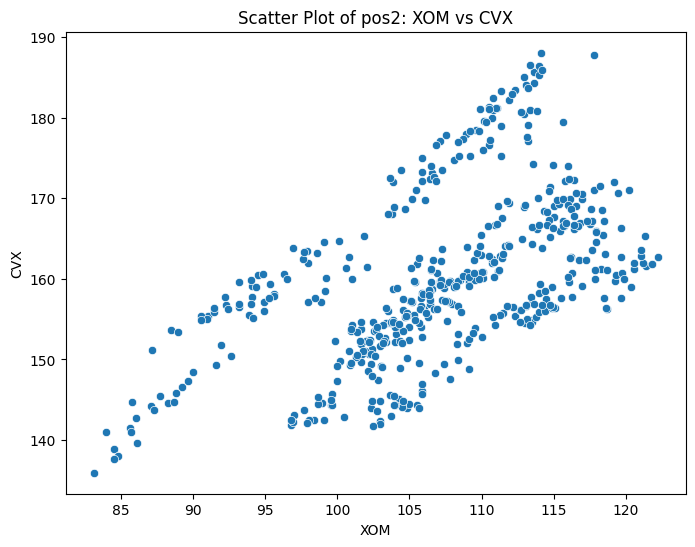

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

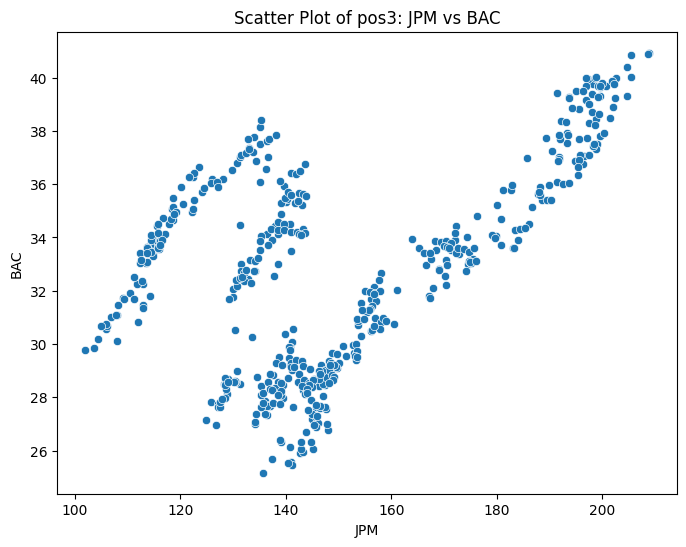

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

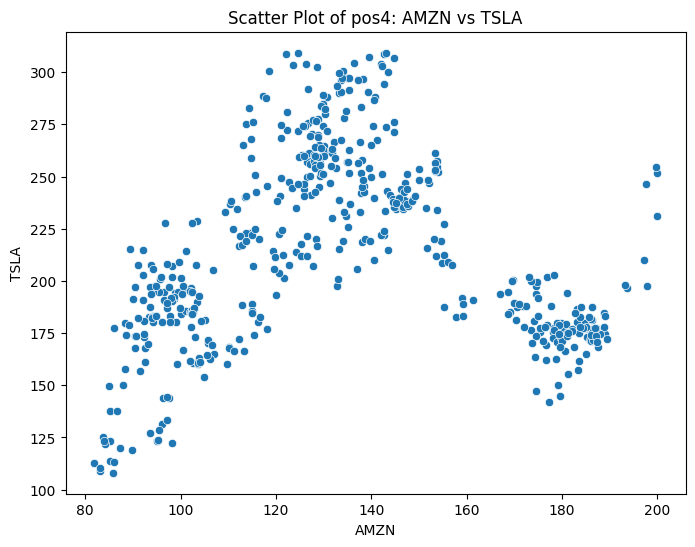

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

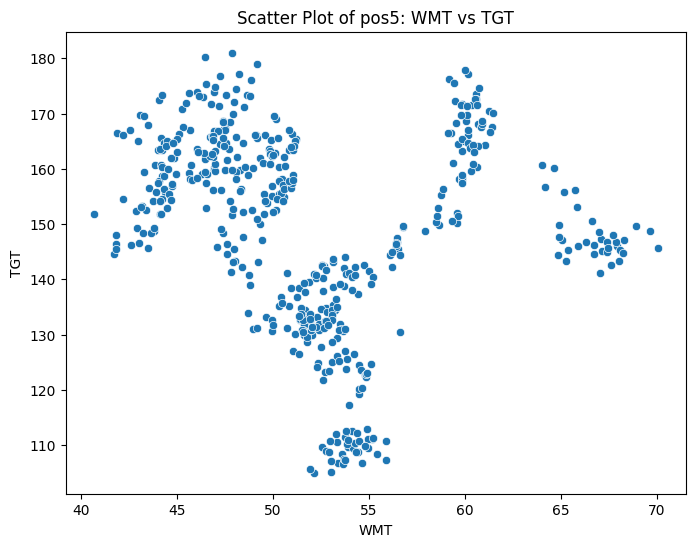

In [8]:
# Loop through each pair and create scatter plots
for key, pair in pairs_for_observation.items():
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=data_yahoo_nodate[pair[0]], y=data_yahoo_nodate[pair[1]])
    plt.title(f'Scatter Plot of {key}: {pair[0]} vs {pair[1]}')
    plt.xlabel(pair[0])
    plt.ylabel(pair[1])
    plt.show()

In [9]:
data_yahoo.to_csv('data_yahoo.csv', index=False)

---
---

## Forming our Strategy

We'll implement a simple **Moving Average Crossover strategy**. This involves using two moving averages (short-term and long-term) to generate buy/sell signals.

Strategy Definition:
* Short-term Moving Average (SMA): 20-day moving average
* Long-term Moving Average (LMA): 50-day moving average
* Buy Signal: When the SMA crosses above the LMA
* Sell Signal: When the SMA crosses below the LMA



---

ASSUMPTIONS:

1. We assume we have an Initial Capital of $100,000. This we invest in all 16 of our stocks equally
2. We always trade in sets of 100 shares

In [12]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Calculate Moving Averages
def calculate_moving_averages(prices, short_window=20, long_window=50):
    # Create a DataFrame to store signals
    signals = pd.DataFrame(index=prices.index)
    signals['price'] = prices
    signals['short_mavg'] = prices.rolling(window=short_window, min_periods=1).mean()
    signals['long_mavg'] = prices.rolling(window=long_window, min_periods=1).mean()
    return signals

# Generate Buy/Sell Signals
def generate_signals(signals, short_window=20):
    signals['signal'] = 0.0
    # Create signals when short_mavg crosses long_mavg
    signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] > signals['long_mavg'][short_window:], 1.0, 0.0)
    signals['positions'] = signals['signal'].diff()
    return signals

# Backtesting the Strategy
def backtest_strategy(prices, signals, initial_capital):
    # Initialize positions DataFrame
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Buy 100 shares
    positions['stock'] = 100 * signals['signal']

    # Initialize the portfolio with value owned
    portfolio = positions.multiply(prices, axis=0)
    pos_diff = positions.diff()

    # Add `holdings` to portfolio
    portfolio['holdings'] = (positions.multiply(prices, axis=0)).sum(axis=1)
    portfolio['cash'] = initial_capital - (pos_diff.multiply(prices, axis=0)).sum(axis=1).cumsum()
    portfolio['total'] = portfolio['cash'] + portfolio['holdings']
    portfolio['returns'] = portfolio['total'].pct_change()

    return portfolio, positions

# Apply the strategy to each stock
short_window = 20
long_window = 50
initial_capital = 100000 / len(price_df.columns)

results = {}
holdings_table = pd.DataFrame(index=price_df.columns, columns=price_df.index)
gain_loss_table = pd.DataFrame(index=price_df.columns, columns=price_df.index)

for stock in price_df.columns:
    signals = calculate_moving_averages(price_df[stock], short_window, long_window)
    signals = generate_signals(signals, short_window)
    portfolio, positions = backtest_strategy(price_df[stock], signals, initial_capital)

    # Store holdings volume for each stock
    holdings_table.loc[stock] = positions['stock'].values

    # Calculate gain/loss in dollar terms for each stock
    gain_loss_table.loc[stock] = portfolio['total'].diff().fillna(0).values

# Display results
print("Holdings Table:")
print(holdings_table)
print("\nGain/Loss Table:")
gain_loss_table

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Holdings Table:
Date 2022-07-06 2022-07-07 2022-07-08 2022-07-11 2022-07-12 2022-07-13  \
AAPL        0.0        0.0        0.0        0.0        0.0        0.0   
AMZN        0.0        0.0        0.0        0.0        0.0        0.0   
BAC         0.0        0.0        0.0        0.0        0.0        0.0   
CVX         0.0        0.0        0.0        0.0        0.0        0.0   
JNJ         0.0        0.0        0.0        0.0        0.0        0.0   
JPM         0.0        0.0        0.0        0.0        0.0        0.0   
MSFT        0.0        0.0        0.0        0.0        0.0        0.0   
NEE         0.0        0.0        0.0        0.0        0.0        0.0   
NEM         0.0        0.0        0.0        0.0        0.0        0.0   
PG          0.0        0.0        0.0        0.0        0.0        0.0   
SH          0.0        0.0        0.0        0.0        0.0        0.0   
SPY         0.0        0.0        0.0        0.0        0.0        0.0   
TGT         0.0       

Date,2022-07-06,2022-07-07,2022-07-08,2022-07-11,2022-07-12,2022-07-13,2022-07-14,2022-07-15,2022-07-18,2022-07-19,...,2024-06-21,2024-06-24,2024-06-25,2024-06-26,2024-06-27,2024-06-28,2024-07-01,2024-07-02,2024-07-03,2024-07-05
AAPL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-218.998718,64.99939,93.000793,417.999268,85.00061,-348.001099,613.000488,352.000427,127.999878,478.999329
AMZN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-350.999451,76.998901,727.000427,424.000549,-460.00061,394.999695,280.000305,-241.000366,241.000366
BAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-50.0,52.999878,-63.999939,-38.000107,25.0,52.000046,23.999786,92.000198,-2.999878,-49.000168
CVX,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
JNJ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
JPM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-236.999512,258.000183,-80.999756,-64.001465,174.000549,308.999634,319.000244,338.000488,-13.999939,-390.000916
MSFT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,407.998657,-210.998535,327.999878,120.999146,69.000244,-589.99939,977.999878,254.998779,148.999023,679.000854
NEE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,34.999847,104.000092,-86.999512,38.999939,34.999847,-291.000366,-90.999603,56.999969,136.000061,0.0
NEM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-55.000305,34.000015,-69.999695,-45.000076,38.999939,2.999878,0.0,0.0,0.0,0.0
PG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,58.999634,19.000244,-159.999084,59.999084,-83.000183,-169.999695,-219.999695,117.999268,-6.999207,138.000488


In [13]:
holdings_table.to_csv('holding_1.csv')
gain_loss_table.to_csv('gain_loss_1.csv')

In [14]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Calculate Moving Averages
def calculate_moving_averages(prices, short_window=20, long_window=50):
    # Create a DataFrame to store signals
    signals = pd.DataFrame(index=prices.index)
    signals['price'] = prices
    signals['short_mavg'] = prices.rolling(window=short_window, min_periods=1).mean()
    signals['long_mavg'] = prices.rolling(window=long_window, min_periods=1).mean()
    return signals

# Generate Buy/Sell Signals
def generate_signals(signals, short_window=20):
    signals['signal'] = 0.0
    # Create signals when short_mavg crosses long_mavg
    signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] > signals['long_mavg'][short_window:], 1.0, 0.0)
    signals['positions'] = signals['signal'].diff()
    return signals

# Backtesting the Strategy
def backtest_strategy(prices, signals, initial_capital):
    # Initialize positions DataFrame
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Buy 100 shares
    positions['stock'] = 100 * signals['signal']

    # Initialize the portfolio with value owned
    portfolio = positions.multiply(prices, axis=0)
    pos_diff = positions.diff()

    # Add `holdings` to portfolio
    portfolio['holdings'] = (positions.multiply(prices, axis=0)).sum(axis=1)
    portfolio['cash'] = initial_capital - (pos_diff.multiply(prices, axis=0)).sum(axis=1).cumsum()
    portfolio['total'] = portfolio['cash'] + portfolio['holdings']
    portfolio['returns'] = portfolio['total'].pct_change()

    return portfolio, positions

# Apply the strategy to each stock
short_window = 20
long_window = 50
initial_capital = 100000 / len(price_df.columns)

results = {}
holdings_table = pd.DataFrame(index=price_df.index, columns=price_df.columns)
gain_loss_table = pd.DataFrame(index=price_df.index, columns=price_df.columns)

for stock in price_df.columns:
    signals = calculate_moving_averages(price_df[stock], short_window, long_window)
    signals = generate_signals(signals, short_window)
    portfolio, positions = backtest_strategy(price_df[stock], signals, initial_capital)

    # Store holdings volume for each stock
    holdings_table[stock] = positions['stock'].values

    # Calculate gain/loss in dollar terms for each stock
    gain_loss_table[stock] = portfolio['total'].diff().fillna(0).values

# Resample the data to monthly frequency and sum the values within each month
holdings_table = holdings_table.resample('M').sum().T
gain_loss_table = gain_loss_table.resample('M').sum().T

# Display results
print("Monthly Aggregated Holdings Table:")
print(holdings_table)
print("\nMonthly Aggregated Gain/Loss Table:")
gain_loss_table

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Monthly Aggregated Holdings Table:
Date  2022-07-31  2022-08-31  2022-09-30  2022-10-31  2022-11-30  2022-12-31  \
AAPL         0.0      2100.0      1100.0         0.0       200.0      1100.0   
AMZN         0.0      2100.0      1200.0         0.0         0.0         0.0   
BAC          0.0      2100.0      1400.0         0.0      2100.0      1100.0   
CVX          0.0      2100.0      1800.0       600.0      2100.0      1300.0   
JNJ          0.0         0.0         0.0       400.0      2100.0      2100.0   
JPM          0.0      2000.0      1400.0       200.0      2100.0      2100.0   
MSFT         0.0      1800.0       700.0         0.0       100.0      2100.0   
NEE          0.0      2100.0      1700.0         0.0       700.0      2100.0   
NEM          0.0         0.0         0.0         0.0      1200.0      2100.0   
PG           0.0      1100.0       300.0         0.0      1300.0      2100.0   
SH           0.0         0.0      1100.0      2100.0       700.0         0.0   
SPY  

Date,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28,2023-03-31,2023-04-30,...,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31
AAPL,0.0,-891.000366,-274.000549,0.000000,-685.000610,-1544.000244,0.000000,-708.999634,1748.999023,477.999878,...,0.000000,250.999451,258.000183,-985.000610,0.000000,0.000000,0.000000,950.999451,1836.999512,1572.000122
AMZN,0.0,-1275.000763,-457.999420,0.000000,0.000000,0.000000,390.999603,-889.999390,-350.000000,434.999847,...,-240.000153,350.000000,585.000610,325.999451,2155.999756,362.001038,-538.000488,144.000244,1495.999146,675.000000
BAC,0.0,-2.999878,-111.000061,0.000000,164.999771,-614.999771,0.000000,-118.000031,-375.999832,0.000000,...,0.000000,47.999954,317.999840,34.000015,51.000214,339.999771,-90.999985,298.000336,-22.000122,63.999939
CVX,0.0,269.999695,-1227.999878,776.998901,241.000366,-1063.999939,-1376.998901,-744.999695,0.000000,-233.999634,...,-1386.999512,0.000000,0.000000,-205.000305,97.000122,573.001099,352.999878,102.999878,-732.000732,0.000000
JNJ,0.0,0.000000,0.000000,175.999451,402.999878,-135.000610,-711.999512,0.000000,0.000000,-213.999939,...,0.000000,0.000000,168.000793,215.998840,-103.999329,-697.000122,0.000000,0.000000,0.000000,0.000000
JPM,0.0,153.000641,-252.000427,-20.000458,1229.999542,-407.998657,586.000061,338.999939,-1509.001160,0.000000,...,0.000000,254.000854,1402.000427,425.999451,1169.999695,1424.000549,-855.999756,63.999939,-37.001038,252.999878
MSFT,0.0,-1885.000610,-947.999573,0.000000,0.000000,-1531.999207,-1097.000122,-1813.999939,3887.998962,1896.002197,...,-256.002808,4080.001831,-286.999512,2153.997803,1606.002808,707.998657,-1847.000122,-1404.000854,3182.000732,2060.998535
NEE,0.0,-140.000153,-397.999573,0.000000,109.999847,-109.999847,-177.999878,0.000000,0.000000,-4.000092,...,0.000000,95.999908,223.000336,-211.000061,111.999893,213.000107,306.000137,1304.999542,-920.999908,102.000427
NEM,0.0,0.000000,0.000000,0.000000,118.000031,-27.000046,572.999954,-870.000076,0.000000,-464.999771,...,0.000000,0.000000,230.999756,-602.999878,0.000000,184.000015,479.999924,129.999924,-6.999969,0.000000
PG,0.0,-1130.000305,-26.000977,0.000000,819.000244,239.999390,-1041.000366,0.000000,233.000183,769.000244,...,0.000000,211.000061,-735.000610,152.000427,180.000305,330.999756,-680.000305,-122.000122,38.000488,29.000854


In [15]:
holdings_table.to_csv('holding_2.csv')
gain_loss_table.to_csv('gain_loss_2.csv')

Here are some of the metrics we use in the performance evaluation:

1. **Total Return**:

* Definition: Total return is the overall return on an investment over a specified period, accounting for both capital gains and dividends or interest
* $\text{Total Return} = \frac{\text{Ending Value}}{\text{Beginning Value}} - 1$
* Unit: Percentage (%)


2. **Annualized Return**:

* Definition: Annualized return is the geometric average amount of money earned by an investment each year over a given time period (The factor 252 is used to annualize the return assuming there are 252 trading days in a year)
* $\text{Annualized Return} = \left(1 + \text{Total Return}\right)^{\frac{252}{\text{Number of Trading Days}}} - 1$
* Unit: Percentage (%)


3. **Annualized Volatility**:

* Definition: Annualized volatility is a measure of the dispersion of returns for a given security or market index, scaled to represent annual fluctuations
* $\text{Annualized Volatility} = \text{Standard Deviation of Daily Returns} \times \sqrt{252}$
* Unit: Percentage (%)

4. **Sharpe Ratio**:

* Definition: The Sharpe ratio is a measure of risk-adjusted return, indicating how much excess return is received for the extra volatility endured by holding a riskier asset
* $\text{Sharpe Ratio} = \frac{\text{Annualized Return}}{\text{Annualized Volatility}}
$
* Unit: Unitless (it is a ratio)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

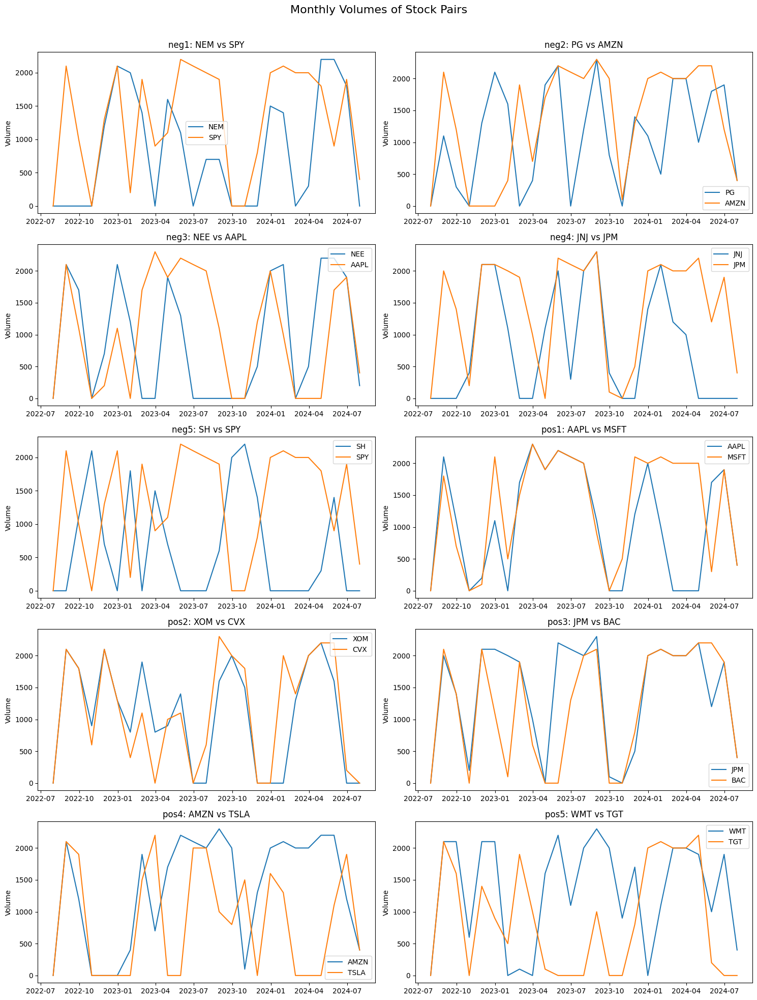

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

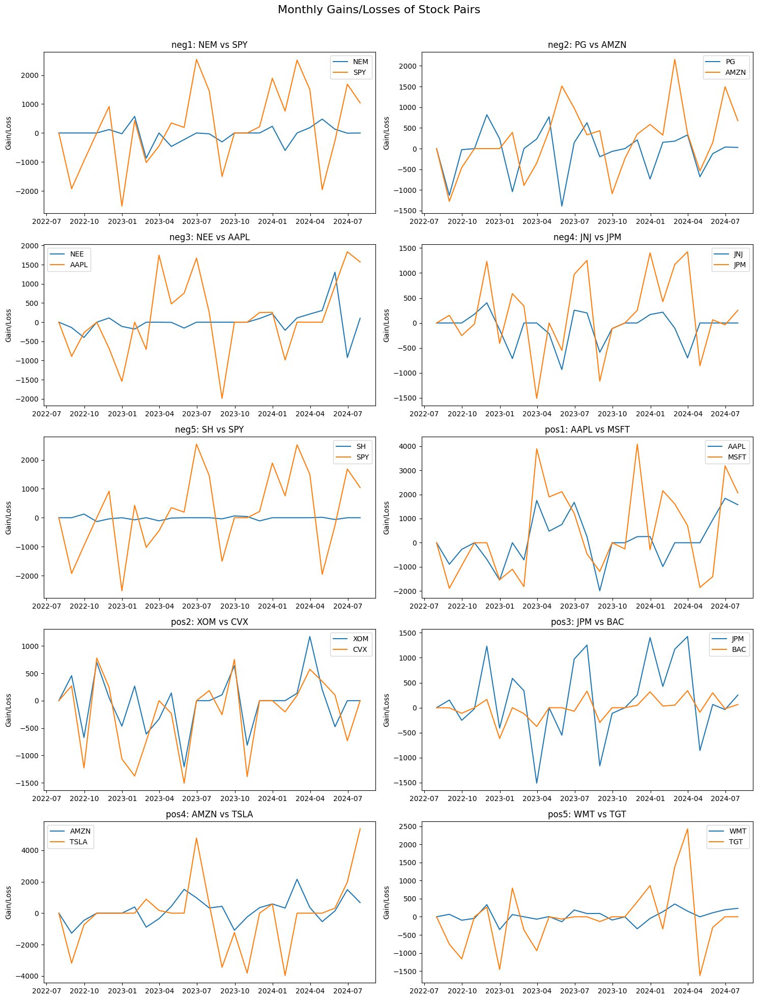

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

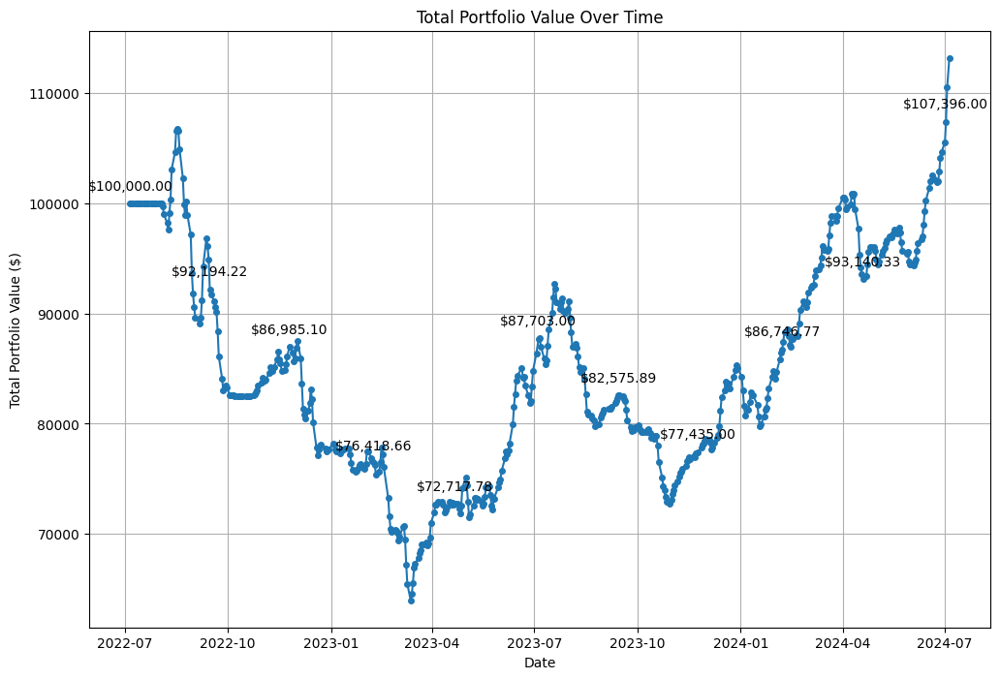

<IPython.core.display.Javascript object>


Performance Metrics:


,Total Return,Annualized Return,Annualized Volatility,Sharpe Ratio
AAPL,0.431520,0.196888,0.627170,0.313931
AMZN,0.853760,0.362364,0.535453,0.676743
BAC,-0.008640,-0.004338,0.110096,-0.039401
CVX,-0.861600,-0.628709,4.732942,-0.132837
JNJ,-0.331520,-0.182721,0.307321,-0.594561
JPM,0.739040,0.319452,0.332745,0.960052
MSFT,1.629280,0.623064,5.284507,0.117904
NEE,0.056320,0.027830,0.190360,0.146199
NEM,-0.131360,-0.068122,0.169536,-0.401814
PG,-0.257920,-0.138815,0.301177,-0.460907


In [16]:
# Function to plot pairs
def plot_pairs(data, title, ylabel, pairs_dict):
    fig, axs = plt.subplots(5, 2, figsize=(15, 20))
    fig.suptitle(title, fontsize=16)

    for i, (key, (stock1, stock2)) in enumerate(pairs_dict.items()):
        row, col = divmod(i, 2)
        axs[row, col].plot(data.columns, data.loc[stock1], label=stock1)
        axs[row, col].plot(data.columns, data.loc[stock2], label=stock2)
        axs[row, col].set_title(f"{key}: {stock1} vs {stock2}")
        axs[row, col].set_ylabel(ylabel)
        axs[row, col].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Plotting the monthly volumes
plot_pairs(holdings_table, "Monthly Volumes of Stock Pairs", "Volume", pairs_for_observation)

# Plotting the monthly gains/losses
plot_pairs(gain_loss_table, "Monthly Gains/Losses of Stock Pairs", "Gain/Loss", pairs_for_observation)

# Function to plot total portfolio value
def plot_total_portfolio_value(portfolio_values):
    fig, ax = plt.subplots(figsize=(12, 8))

    # Smoothing the plot
    portfolio_values_smooth = portfolio_values.rolling(window=3, min_periods=1).mean()

    ax.plot(portfolio_values_smooth.index, portfolio_values_smooth, marker='o', markersize=4)

    # Determine the number of data points
    num_points = len(portfolio_values_smooth)

    # Calculate the interval for data labels (aim for approximately 10 labels)
    interval = max(1, num_points // 10)

    # Adding data labels based on calculated interval
    for i in range(0, num_points, interval):
        ax.annotate(f"${portfolio_values_smooth.iloc[i]:,.2f}", (portfolio_values_smooth.index[i], portfolio_values_smooth.iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_title('Total Portfolio Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Portfolio Value ($)')
    plt.grid(True)
    plt.show()

# Define performance evaluation function
def evaluate_performance(portfolio):
    total_return = portfolio['total'].iloc[-1] / portfolio['total'].iloc[0] - 1
    annualized_return = (1 + total_return) ** (252.0 / len(portfolio)) - 1
    annualized_volatility = portfolio['returns'].std() * np.sqrt(252)
    sharpe_ratio = annualized_return / annualized_volatility

    performance = {
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility,
        'Sharpe Ratio': sharpe_ratio
    }

    return performance

# Evaluate the performance for each stock and aggregate portfolio value
portfolio_values = pd.Series(dtype=float)
performance_results = {}  # Initialize performance_results as an empty dictionary

for stock in price_df.columns:
    signals = calculate_moving_averages(price_df[stock], short_window, long_window)
    signals = generate_signals(signals, short_window)
    portfolio, _ = backtest_strategy(price_df[stock], signals, initial_capital)
    performance = evaluate_performance(portfolio)
    performance_results[stock] = performance

    if portfolio_values.empty:
        portfolio_values = portfolio['total']
    else:
        portfolio_values += portfolio['total']

# Evaluate aggregated portfolio performance
aggregated_performance = evaluate_performance(pd.DataFrame({'total': portfolio_values, 'returns': portfolio_values.pct_change()}))
performance_results['Aggregated Portfolio'] = aggregated_performance

# Plot total portfolio value
plot_total_portfolio_value(portfolio_values)

# Create a DataFrame for performance results
performance_df = pd.DataFrame(performance_results).T
performance_df.to_csv('performance_metrics_1.csv')

# Display the performance results
print("\nPerformance Metrics:")
performance_df


---
---

## Improving our Strategy

Our previously implemented **Moving Average Crossover strategy** has a severe drawback, that we invest our capital in all 16 of our stocks equally, this reduces the possibility of dynamically adjusting invested capital based on stock prices. We will get rid of this assumption in this section and evaluate gains.

Our strategy is modified to handle pooled capital and make buy/sell decisions based on the available cash and potential gains. It iterates over each day, selling stocks with a sell signal and buying stocks with a buy signal, while ensuring the cash is available


Strategy Definition (same as before):

* Short-term Moving Average (SMA): 20-day moving average
* Long-term Moving Average (LMA): 50-day moving average
* Buy Signal: When the SMA crosses above the LMA
* Sell Signal: When the SMA crosses below the LMA

---

ASSUMPTIONS:

1. We assume we have an Initial Capital of $100,000
2. We always trade in sets of 100 shares

In [17]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Calculate Moving Averages
def calculate_moving_averages(prices, short_window=20, long_window=50):
    signals = pd.DataFrame(index=prices.index)
    signals['price'] = prices
    signals['short_mavg'] = prices.rolling(window=short_window, min_periods=1).mean()
    signals['long_mavg'] = prices.rolling(window=long_window, min_periods=1).mean()
    return signals

# Generate Buy/Sell Signals
def generate_signals(signals, short_window=20):
    signals['signal'] = 0.0
    signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] > signals['long_mavg'][short_window:], 1.0, 0.0)
    signals['positions'] = signals['signal'].diff()
    return signals

# Backtesting the Strategy
def backtest_strategy(prices, signals, initial_capital):
    cash = initial_capital
    holdings = {stock: 0 for stock in prices.columns}
    portfolio_value = initial_capital

    portfolio_history = []
    holdings_history = []
    gain_loss_history = []

    for date in prices.index:
        daily_signals = signals.loc[date]
        daily_prices = prices.loc[date]

        daily_holdings = holdings.copy()

        buy_signals = daily_signals[daily_signals == 1.0].index
        sell_signals = daily_signals[daily_signals == -1.0].index

        daily_gain_loss = {stock: 0 for stock in prices.columns}

        # Sell stocks
        for stock in sell_signals:
            if holdings[stock] > 0:
                cash += holdings[stock] * daily_prices[stock]
                daily_gain_loss[stock] = holdings[stock] * daily_prices[stock]
                holdings[stock] = 0

        # Buy stocks
        for stock in buy_signals:
            if cash > 0:
                shares_to_buy = (cash // daily_prices[stock]) // 100 * 100  # Buy in sets of 100 shares
                if shares_to_buy > 0:
                    cash -= shares_to_buy * daily_prices[stock]
                    holdings[stock] += shares_to_buy

        # Calculate portfolio value
        portfolio_value = cash + sum(holdings[stock] * daily_prices[stock] for stock in holdings)
        portfolio_history.append(portfolio_value)
        holdings_history.append(daily_holdings)
        gain_loss_history.append(daily_gain_loss)

    portfolio_df = pd.DataFrame(portfolio_history, index=prices.index, columns=['Total Portfolio Value'])
    holdings_df = pd.DataFrame(holdings_history, index=prices.index)
    gain_loss_df = pd.DataFrame(gain_loss_history, index=prices.index)

    return portfolio_df, holdings_df, gain_loss_df

# Apply the strategy to each stock
short_window = 20
long_window = 50
initial_capital = 100000

# Calculate signals for all stocks
all_signals = {stock: calculate_moving_averages(price_df[stock], short_window, long_window) for stock in price_df.columns}
all_signals = {stock: generate_signals(signals, short_window) for stock, signals in all_signals.items()}

# Combine signals into a single DataFrame
combined_signals = pd.DataFrame({stock: signals['positions'] for stock, signals in all_signals.items()})

# Backtest the strategy using pooled capital
portfolio_df, holdings_df, gain_loss_df = backtest_strategy(price_df, combined_signals, initial_capital)

# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Display results
print("Monthly Aggregated Holdings Table:")
print(monthly_holdings)
print("\nMonthly Aggregated Gain/Loss Table:")
monthly_gain_loss

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Monthly Aggregated Holdings Table:
Date  2022-07-31  2022-08-31  2022-09-30  2022-10-31  2022-11-30  2022-12-31  \
AAPL         0.0       600.0         0.0         0.0         0.0         0.0   
AMZN         0.0         0.0         0.0         0.0         0.0         0.0   
BAC          0.0         0.0         0.0         0.0         0.0         0.0   
CVX          0.0         0.0         0.0         0.0         0.0         0.0   
JNJ          0.0         0.0         0.0         0.0         0.0         0.0   
JPM          0.0         0.0         0.0         0.0         0.0         0.0   
MSFT         0.0         0.0         0.0         0.0         0.0         0.0   
NEE          0.0         0.0         0.0         0.0         0.0         0.0   
NEM          0.0         0.0         0.0         0.0         0.0         0.0   
PG           0.0         0.0         0.0         0.0         0.0         0.0   
SH           0.0         0.0         0.0         0.0         0.0         0.0   
SPY  

Date,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28,2023-03-31,2023-04-30,...,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31
AAPL,0.0,0.0,92687.997437,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
AMZN,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
BAC,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,9162.000275,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
CVX,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
JNJ,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
JPM,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,76744.000244,0.000000,0.0
MSFT,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
NEE,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,5975.0,0.0,0.000000,0.000000,0.000000,0.0
NEM,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,14144.000244,0.0,0.0,0.000000,0.000000,4186.999893,0.0
PG,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,15544.999695,0.000000,0.000000,0.0


In [18]:
monthly_holdings.to_csv('holding_3.csv')
monthly_gain_loss.to_csv('gain_loss_3.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

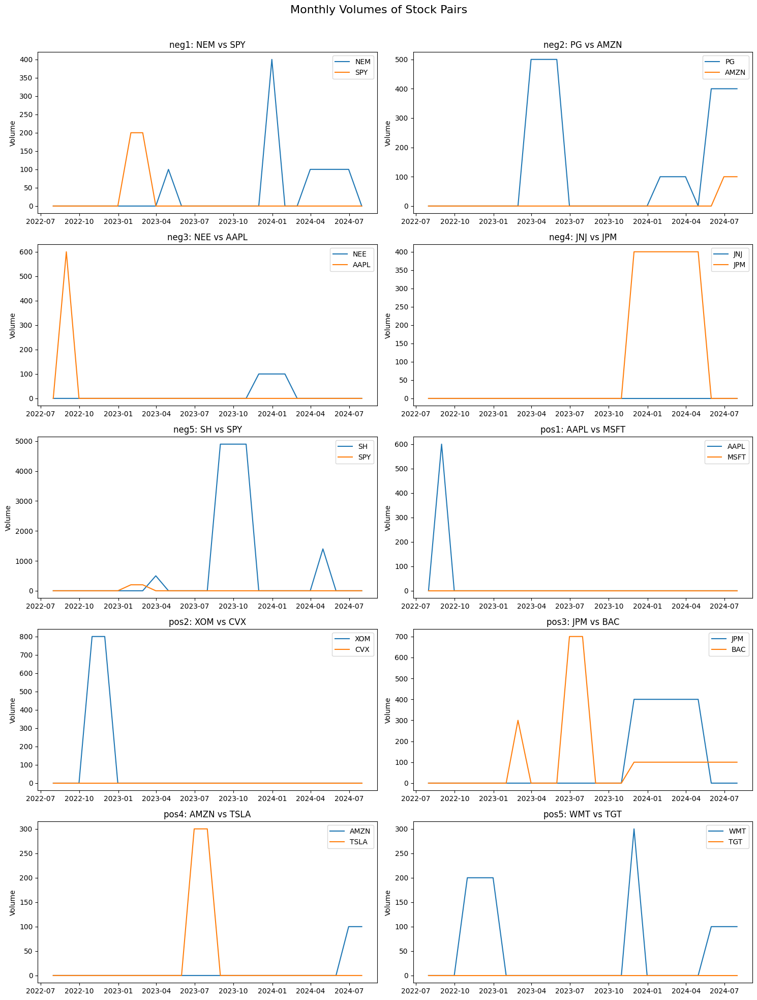

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

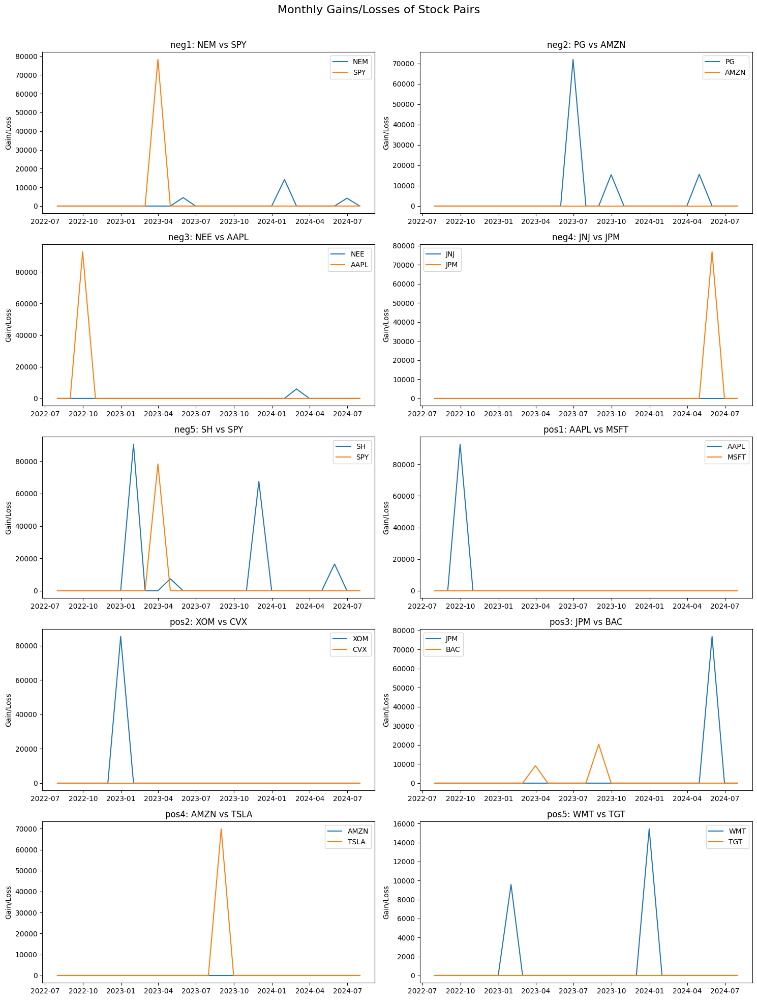

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

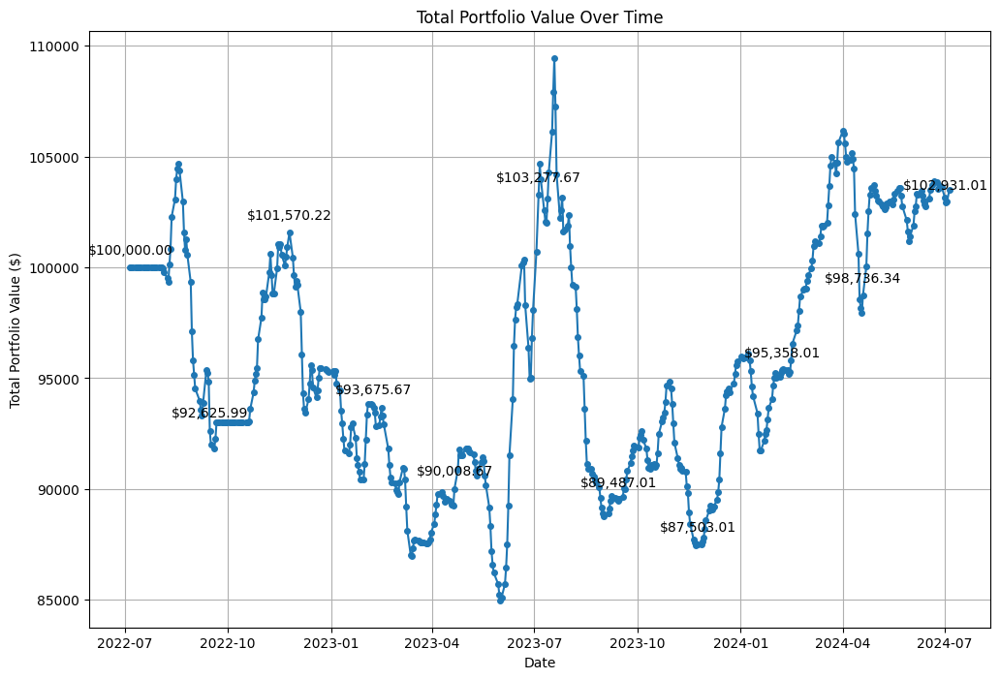

<IPython.core.display.Javascript object>


Performance Metrics:
   Total Return  Annualized Return  Annualized Volatility  Sharpe Ratio
0      0.040407           0.020044               0.189505      0.105767


In [19]:
# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T


# Function to plot pairs
def plot_pairs(data, title, ylabel, pairs_dict):
    fig, axs = plt.subplots(5, 2, figsize=(15, 20))
    fig.suptitle(title, fontsize=16)

    for i, (key, (stock1, stock2)) in enumerate(pairs_dict.items()):
        row, col = divmod(i, 2)
        if stock1 in data.index and stock2 in data.index:
            axs[row, col].plot(data.columns, data.loc[stock1], label=stock1)
            axs[row, col].plot(data.columns, data.loc[stock2], label=stock2)
            axs[row, col].set_title(f"{key}: {stock1} vs {stock2}")
            axs[row, col].set_ylabel(ylabel)
            axs[row, col].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Plotting the monthly volumes
plot_pairs(monthly_holdings, "Monthly Volumes of Stock Pairs", "Volume", pairs_for_observation)

# Plotting the monthly gains/losses
plot_pairs(monthly_gain_loss, "Monthly Gains/Losses of Stock Pairs", "Gain/Loss", pairs_for_observation)

# Function to plot total portfolio value
def plot_total_portfolio_value(portfolio_values):
    fig, ax = plt.subplots(figsize=(12, 8))

    # Smoothing the plot
    portfolio_values_smooth = portfolio_values.rolling(window=3, min_periods=1).mean()

    ax.plot(portfolio_values_smooth.index, portfolio_values_smooth, marker='o', markersize=4)

    # Determine the number of data points
    num_points = len(portfolio_values_smooth)

    # Calculate the interval for data labels (aim for approximately 10 labels)
    interval = max(1, num_points // 10)

    # Adding data labels based on calculated interval
    for i in range(0, num_points, interval):
        ax.annotate(f"${portfolio_values_smooth.iloc[i]:,.2f}", (portfolio_values_smooth.index[i], portfolio_values_smooth.iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_title('Total Portfolio Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Portfolio Value ($)')
    plt.grid(True)
    plt.show()

# Define performance evaluation function
def evaluate_performance(portfolio):
    total_return = portfolio['Total Portfolio Value'].iloc[-1] / portfolio['Total Portfolio Value'].iloc[0] - 1
    annualized_return = (1 + total_return) ** (252.0 / len(portfolio)) - 1
    annualized_volatility = portfolio['Total Portfolio Value'].pct_change().std() * np.sqrt(252)
    sharpe_ratio = annualized_return / annualized_volatility

    performance = {
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility,
        'Sharpe Ratio': sharpe_ratio
    }

    return performance

# Evaluate the performance for the aggregated portfolio value
portfolio_values = portfolio_df['Total Portfolio Value']
performance_results = evaluate_performance(portfolio_df)

# Plot total portfolio value
plot_total_portfolio_value(portfolio_values)

# Create a DataFrame for performance results
performance_df = pd.DataFrame(performance_results, index=[0])
performance_df.to_csv('performance_metrics_1.csv')

# Display the performance results
print("\nPerformance Metrics:")
print(performance_df)


---
---

## SOTA Strategy #1 - High Freq. Trading

High-Frequency Trading (HFT) is an algorithmic trading strategy that involves executing a large number of orders at extremely high speeds. The concept behind HFT involves using sophisticated algorithms and advanced technology to exploit small price discrepancies in the market. Here are the key aspects:

> Speed: HFT relies on ultra-fast execution, often measured in microseconds or nanoseconds, to capitalize on fleeting market opportunities

> Algorithms: Complex algorithms are used to analyze market data and execute trades. These algorithms can detect patterns, trends, and arbitrage opportunities faster than human traders

> High Volume: HFT involves a high volume of trades with small profit margins. The cumulative profit from many small trades can be substantial

---

Our strategy is modified remove the assumption of buying in sets of 100 shares. Now the algorithm buys as many shares as the available cash allows.

Strategy Definition (same as before):

* Short-term Moving Average (SMA): 20-day moving average
* Long-term Moving Average (LMA): 50-day moving average
* Buy Signal: When the SMA crosses above the LMA
* Sell Signal: When the SMA crosses below the LMA

---

ASSUMPTIONS:

1. We assume we have an Initial Capital of $100,000
2. We assume transaction costs are maintained at 0.1% per trade to simulate real-world trading conditions

In [10]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Calculate Moving Averages
def calculate_moving_averages(prices, short_window, long_window):
    signals = pd.DataFrame(index=prices.index)
    signals['price'] = prices
    signals['short_mavg'] = prices.rolling(window=short_window, min_periods=1).mean()
    signals['long_mavg'] = prices.rolling(window=long_window, min_periods=1).mean()
    return signals

# Generate Buy/Sell Signals
def generate_signals(signals, short_window):
    signals['signal'] = 0.0
    signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] > signals['long_mavg'][short_window:], 1.0, 0.0)
    signals['positions'] = signals['signal'].diff()
    return signals

# Backtesting the Strategy with transaction cost and slippage
def backtest_strategy(prices, signals, initial_capital, transaction_cost=0.001):
    cash = initial_capital
    holdings = {stock: 0 for stock in prices.columns}
    portfolio_value = initial_capital

    portfolio_history = []
    holdings_history = []
    gain_loss_history = []

    for date in prices.index:
        daily_signals = signals.loc[date]
        daily_prices = prices.loc[date]

        daily_holdings = holdings.copy()

        buy_signals = daily_signals[daily_signals == 1.0].index
        sell_signals = daily_signals[daily_signals == -1.0].index

        daily_gain_loss = {stock: 0 for stock in prices.columns}

        # Sell stocks
        for stock in sell_signals:
            if holdings[stock] > 0:
                sell_amount = holdings[stock] * daily_prices[stock]
                cash += sell_amount * (1 - transaction_cost)
                daily_gain_loss[stock] = sell_amount * (1 - transaction_cost)
                holdings[stock] = 0

        # Buy stocks
        for stock in buy_signals:
            if cash > 0:
                shares_to_buy = cash // daily_prices[stock]
                if shares_to_buy > 0:
                    buy_amount = shares_to_buy * daily_prices[stock]
                    cash -= buy_amount * (1 + transaction_cost)
                    holdings[stock] += shares_to_buy

        # Calculate portfolio value
        portfolio_value = cash + sum(holdings[stock] * daily_prices[stock] for stock in holdings)
        portfolio_history.append(portfolio_value)
        holdings_history.append(daily_holdings)
        gain_loss_history.append(daily_gain_loss)

    portfolio_df = pd.DataFrame(portfolio_history, index=prices.index, columns=['Total Portfolio Value'])
    holdings_df = pd.DataFrame(holdings_history, index=prices.index)
    gain_loss_df = pd.DataFrame(gain_loss_history, index=prices.index)

    return portfolio_df, holdings_df, gain_loss_df

# Parameters
short_window = 20
long_window = 50
initial_capital = 100000

# Calculate signals for all stocks
all_signals = {stock: calculate_moving_averages(price_df[stock], short_window, long_window) for stock in price_df.columns}
all_signals = {stock: generate_signals(signals, short_window) for stock, signals in all_signals.items()}

# Combine signals into a single DataFrame
combined_signals = pd.DataFrame({stock: signals['positions'] for stock, signals in all_signals.items()})

# Backtest the strategy using pooled capital
portfolio_df, holdings_df, gain_loss_df = backtest_strategy(price_df, combined_signals, initial_capital)

# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Display results
print("Monthly Aggregated Holdings Table:")
print(monthly_holdings)
print("\nMonthly Aggregated Gain/Loss Table:")
monthly_gain_loss

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Monthly Aggregated Holdings Table:
Date  2022-07-31  2022-08-31  2022-09-30  2022-10-31  2022-11-30  2022-12-31  \
AAPL         0.0       604.0         0.0         0.0         0.0         0.0   
AMZN         0.0         0.0         0.0         0.0         0.0         0.0   
BAC          0.0         0.0         0.0         0.0         0.0         0.0   
CVX          0.0         0.0         0.0         0.0         0.0         0.0   
JNJ          0.0         0.0         0.0         0.0         0.0         0.0   
JPM          0.0         0.0         0.0         0.0         0.0         0.0   
MSFT         0.0         0.0         0.0         0.0         0.0         0.0   
NEE          0.0         0.0         0.0         0.0         0.0         0.0   
NEM          0.0         0.0         0.0         0.0         0.0         0.0   
PG           0.0         0.0         0.0         0.0         0.0         0.0   
SH           0.0         0.0         1.0         1.0         0.0         0.0   
SPY  

Date,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28,2023-03-31,2023-04-30,...,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31
AAPL,0.0,0.0,93212.611502,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
AMZN,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
BAC,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,61.018922,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
CVX,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
JNJ,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
JPM,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,114234.211803,0.0,0.0
MSFT,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
NEE,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
NEM,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
PG,0.0,0.0,0.000000,0.0,0.00000,0.00000,0.000000,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [11]:
monthly_holdings.to_csv('holding_4.csv')
monthly_gain_loss.to_csv('gain_loss_4.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

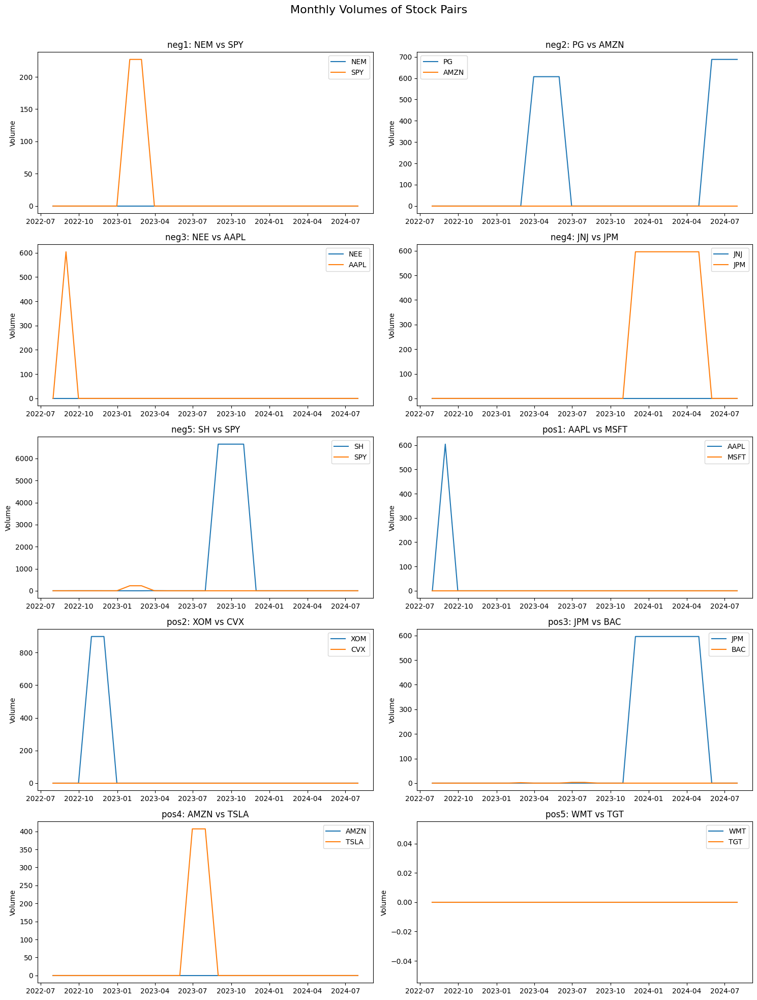

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

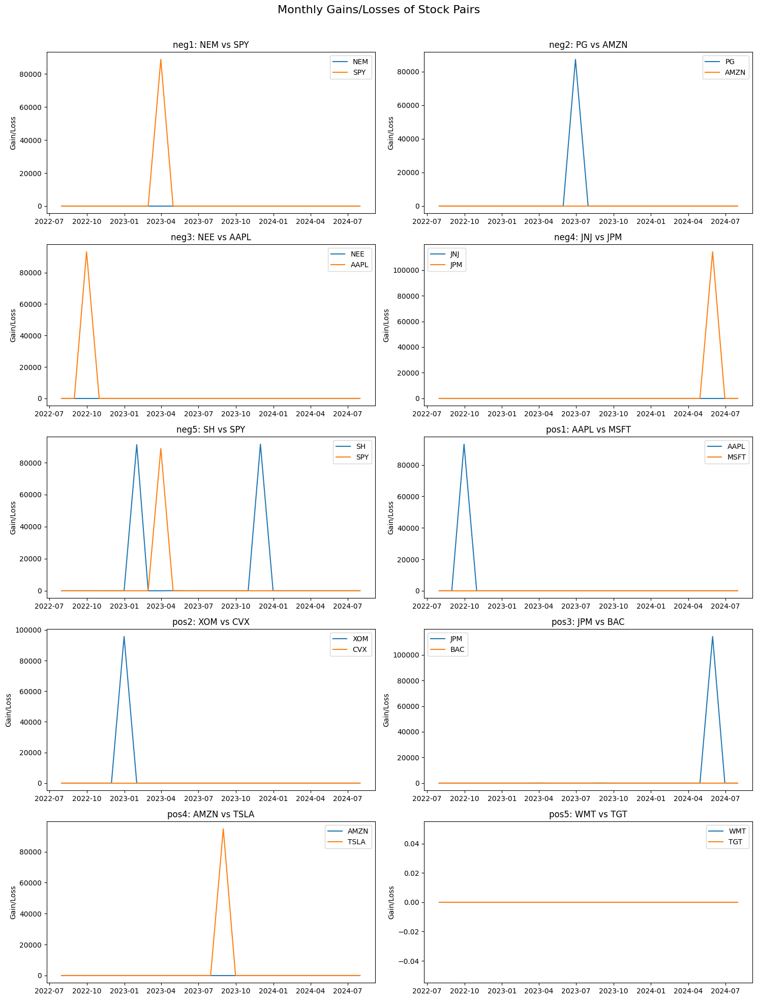

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

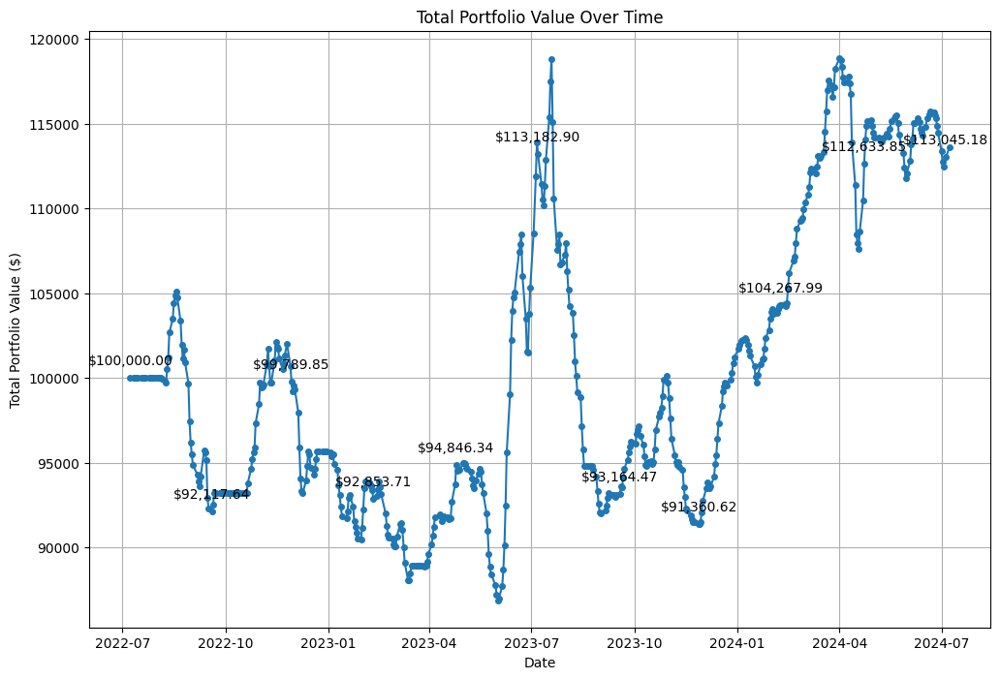

<IPython.core.display.Javascript object>


Performance Metrics:


,Total Return,Annualized Return,Annualized Volatility,Sharpe Ratio
0,0.143707,0.069729,0.219192,0.318116


In [12]:
# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Function to plot pairs
def plot_pairs(data, title, ylabel, pairs_dict):
    fig, axs = plt.subplots(5, 2, figsize=(15, 20))
    fig.suptitle(title, fontsize=16)

    for i, (key, (stock1, stock2)) in enumerate(pairs_dict.items()):
        row, col = divmod(i, 2)
        if stock1 in data.index and stock2 in data.index:
            axs[row, col].plot(data.columns, data.loc[stock1], label=stock1)
            axs[row, col].plot(data.columns, data.loc[stock2], label=stock2)
            axs[row, col].set_title(f"{key}: {stock1} vs {stock2}")
            axs[row, col].set_ylabel(ylabel)
            axs[row, col].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


# Plotting the monthly volumes
plot_pairs(monthly_holdings, "Monthly Volumes of Stock Pairs", "Volume", pairs_for_observation)

# Plotting the monthly gains/losses
plot_pairs(monthly_gain_loss, "Monthly Gains/Losses of Stock Pairs", "Gain/Loss", pairs_for_observation)

# Function to plot total portfolio value
def plot_total_portfolio_value(portfolio_values):
    fig, ax = plt.subplots(figsize=(12, 8))

    # Smoothing the plot
    portfolio_values_smooth = portfolio_values.rolling(window=3, min_periods=1).mean()

    ax.plot(portfolio_values_smooth.index, portfolio_values_smooth, marker='o', markersize=4)

    # Determine the number of data points
    num_points = len(portfolio_values_smooth)

    # Calculate the interval for data labels (aim for approximately 10 labels)
    interval = max(1, num_points // 10)

    # Adding data labels based on calculated interval
    for i in range(0, num_points, interval):
        ax.annotate(f"${portfolio_values_smooth.iloc[i]:,.2f}", (portfolio_values_smooth.index[i], portfolio_values_smooth.iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_title('Total Portfolio Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Portfolio Value ($)')
    plt.grid(True)
    plt.show()

# Define performance evaluation function
def evaluate_performance(portfolio):
    total_return = portfolio['Total Portfolio Value'].iloc[-1] / portfolio['Total Portfolio Value'].iloc[0] - 1
    annualized_return = (1 + total_return) ** (252.0 / len(portfolio)) - 1
    annualized_volatility = portfolio['Total Portfolio Value'].pct_change().std() * np.sqrt(252)
    sharpe_ratio = annualized_return / annualized_volatility

    performance = {
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility,
        'Sharpe Ratio': sharpe_ratio
    }

    return performance

# Evaluate the performance for the aggregated portfolio value
portfolio_values = portfolio_df['Total Portfolio Value']
performance_results = evaluate_performance(portfolio_df)

# Plot total portfolio value
plot_total_portfolio_value(portfolio_values)

# Create a DataFrame for performance results
performance_df = pd.DataFrame(performance_results, index=[0])
performance_df.to_csv('performance_metrics.csv')

# Display the performance results
print("\nPerformance Metrics:")
performance_df

**REAL LIFE EXAMPLES:**

* One notable example of a firm using high-frequency trading (HFT) algorithms to achieve significant gains is Citadel Securities. Citadel Securities is one of the largest and most influential HFT firms globally, consistently employing sophisticated algorithms to execute trades at lightning speeds. In 2020, Citadel Securities made headlines when it reported earning $6.7 billion in revenue, a significant portion of which was attributed to its HFT operations. The firm uses a combination of arbitrage strategies, market-making, and rapid execution to capitalize on small price discrepancies across different markets. These strategies allow Citadel to make numerous trades within microseconds, earning profits from even minute price changes

> Refences: https://www.bloomberg.com/news/articles/2021-01-22/citadel-securities-reaps-record-6-7-billion-year-on-volatility


* Another significant player in the HFT space is Virtu Financial. Virtu is known for its highly efficient trading algorithms and has maintained a high level of profitability. For instance, in the first quarter of 2020, Virtu Financial reported a net trading income of $802 million, a substantial increase from previous years. This success was largely driven by the volatility in the markets, which created more opportunities for their HFT strategies to thrive

> Refences: https://www.nasdaq.com/articles/virtu-financial-finds-more-success-in-volatility-2020-05-11

---
---


## SOTA Strategy #2 - Momentum Trading

Momentum trading is a strategy in algorithmic trading that aims to capitalize on the continuance of existing trends in the market. The fundamental idea is that securities that have shown an upward trend will continue to do so for some time, and those that have been declining will also continue to decline. Here are the key concepts involved in momentum trading algorithmic strategies:

> Trend Following: The core principle of momentum trading is to follow the trend. Traders buy assets that are rising and sell those that are falling. The assumption is that the asset's price will continue to move in the same direction

> Indicators and Signals: Various technical indicators are used to identify momentum and generate buy or sell signals. Common indicators include Simple Moving Averages (SMA) or Exponential Moving Averages (EMA) help smooth out price data and identify trends

> Volume Analysis: Volume is a critical component in momentum trading. An increase in volume is often seen as a confirmation of a trend. High volume on upward moves indicates strong buying interest, while high volume on downward moves indicates strong selling interest

> Time Frames: Momentum strategies can be applied to various time frames, from short-term intraday trading to longer-term investments. The choice of time frame depends on the trader's goals and risk tolerance

> Risk Management: This involves setting stop-loss orders to limit potential losses if the market moves against the position. Proper risk management ensures that a few losing trades do not wipe out the gains from successful trades

---

We no longer are assuming trades to happen in sets of 100. Now the algorithm buys and sells as many shares as optimal.

Strategy Definition (different than before):

* We calculate Momentum Indicator using a strategy called the Rate of Change (ROC) for each stock. This is a measure of how much the price of a stock has changed over a certain period (like 20 days here)

* To calculate ROC, we take the price of the stock today and compare it to the price from 20 days ago. We then express this change as a percentage. If the price has gone up, the ROC is positive. If the price has gone down, the ROC is negative

* To generate a Buy Signal - If the ROC is above a certain threshold (say 5% here), it means the stock price is rising quickly, and we generate a signal to buy the stock

* To generate a Sell Signal - If the ROC is below a certain negative threshold (say -5% here), it means the stock price is falling quickly, and we generate a signal to sell the stock

---

ASSUMPTIONS:

1. We assume we have and Initial Capital of $100,000
2. The logic for generating buy/sell signals based on ROC (Return on Capital)
3. The chosen threshold values for generating buy/sell signals is 5%
4. The window size used for calculating the Momentum Signal is 20 days

In [13]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Calculate Momentum Indicators
def calculate_momentum_indicators(prices, window=20):
    signals = pd.DataFrame(index=prices.index)
    signals['price'] = prices
    signals['roc'] = ((prices - prices.shift(window)) / prices.shift(window)) * 100
    return signals

# Generate Buy/Sell Signals based on Momentum
def generate_momentum_signals(signals, window=20, threshold=5):
    signals['signal'] = 0.0
    signals['signal'][window:] = np.where(signals['roc'][window:] > threshold, 1.0, np.where(signals['roc'][window:] < -threshold, -1.0, 0.0))
    signals['positions'] = signals['signal'].diff()
    return signals

# Backtesting the Strategy
def backtest_strategy(prices, signals, initial_capital):
    cash = initial_capital
    holdings = {stock: 0 for stock in prices.columns}
    portfolio_value = initial_capital

    portfolio_history = []
    holdings_history = []
    gain_loss_history = []

    for date in prices.index:
        daily_signals = signals.loc[date]
        daily_prices = prices.loc[date]

        daily_holdings = holdings.copy()

        buy_signals = daily_signals[daily_signals == 1.0].index
        sell_signals = daily_signals[daily_signals == -1.0].index

        daily_gain_loss = {stock: 0 for stock in prices.columns}

        # Sell stocks
        for stock in sell_signals:
            if holdings[stock] > 0:
                cash += holdings[stock] * daily_prices[stock]
                daily_gain_loss[stock] = holdings[stock] * daily_prices[stock]
                holdings[stock] = 0

        # Buy stocks
        for stock in buy_signals:
            if cash > 0:
                shares_to_buy = cash // daily_prices[stock]
                if shares_to_buy > 0:
                    cash -= shares_to_buy * daily_prices[stock]
                    holdings[stock] += shares_to_buy

        # Calculate portfolio value
        portfolio_value = cash + sum(holdings[stock] * daily_prices[stock] for stock in holdings)
        portfolio_history.append(portfolio_value)
        holdings_history.append(daily_holdings)
        gain_loss_history.append(daily_gain_loss)

    portfolio_df = pd.DataFrame(portfolio_history, index=prices.index, columns=['Total Portfolio Value'])
    holdings_df = pd.DataFrame(holdings_history, index=prices.index)
    gain_loss_df = pd.DataFrame(gain_loss_history, index=prices.index)

    return portfolio_df, holdings_df, gain_loss_df

# Apply the strategy to each stock
window = 20
threshold = 5
initial_capital = 100000

# Calculate signals for all stocks
all_signals = {stock: calculate_momentum_indicators(price_df[stock], window) for stock in price_df.columns}
all_signals = {stock: generate_momentum_signals(signals, window, threshold) for stock, signals in all_signals.items()}

# Combine signals into a single DataFrame
combined_signals = pd.DataFrame({stock: signals['positions'] for stock, signals in all_signals.items()})

# Backtest the strategy using pooled capital
portfolio_df, holdings_df, gain_loss_df = backtest_strategy(price_df, combined_signals, initial_capital)

# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Display results
print("Monthly Aggregated Holdings Table:")
print(monthly_holdings)
print("\nMonthly Aggregated Gain/Loss Table:")
monthly_gain_loss

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Monthly Aggregated Holdings Table:
Date  2022-07-31  2022-08-31  2022-09-30  2022-10-31  2022-11-30  2022-12-31  \
AAPL         0.0         0.0         0.0         0.0         0.0         0.0   
AMZN         0.0         0.0         0.0         0.0         0.0         0.0   
BAC          0.0         0.0         0.0         0.0         0.0         0.0   
CVX          0.0         0.0         0.0         0.0         0.0       628.0   
JNJ          0.0         0.0         0.0         0.0         0.0         0.0   
JPM          0.0         0.0         0.0         0.0         0.0         0.0   
MSFT         0.0         0.0         0.0         0.0         0.0         0.0   
NEE          0.0         0.0         0.0         0.0         0.0         0.0   
NEM          0.0         0.0         0.0         0.0         0.0         0.0   
PG           0.0         0.0         0.0         0.0         0.0         0.0   
SH           0.0         2.0      5874.0         0.0         1.0         4.0   
SPY  

Date,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28,2023-03-31,2023-04-30,...,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31
AAPL,0.0,98826.477051,0.000000,0.000000,0.000000,109178.882812,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,127691.975159,124414.079590,0.000000,250646.800812,0.000000,146989.152451,0.000000,0.000000
AMZN,0.0,0.000000,253.639999,95671.447586,0.000000,0.000000,0.000000,115031.801788,0.000000,0.00000,...,0.000000,0.000000,127687.196960,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BAC,0.0,104.160004,0.000000,0.000000,0.000000,0.000000,67.119999,119947.764099,0.000000,0.00000,...,0.000000,0.000000,0.000000,131.199997,237.719994,126803.209454,36.650002,0.000000,0.000000,0.000000
CVX,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,113605.196167,0.000000,0.000000,0.00000,...,0.000000,0.000000,127976.393738,124683.000000,130997.023102,0.000000,0.000000,0.000000,0.000000,0.000000
JNJ,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,127696.683014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
JPM,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,144533.621353,0.000000,0.000000
MSFT,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,131156.005859,0.000000,0.000000,0.000000,127990.802307,0.000000,0.000000,0.000000,0.000000,0.000000
NEE,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,71.029999,125563.322983,0.00000,...,0.000000,124652.162781,0.000000,124.090000,55.150002,0.000000,0.000000,0.000000,211.320007,0.000000
NEM,0.0,84.400002,0.000000,42.599998,0.000000,47.369999,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,147394.059444,161.840004,131.924995
PG,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,122306.097443,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [14]:
monthly_holdings.to_csv('holding_5.csv')
monthly_gain_loss.to_csv('gain_loss_5.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

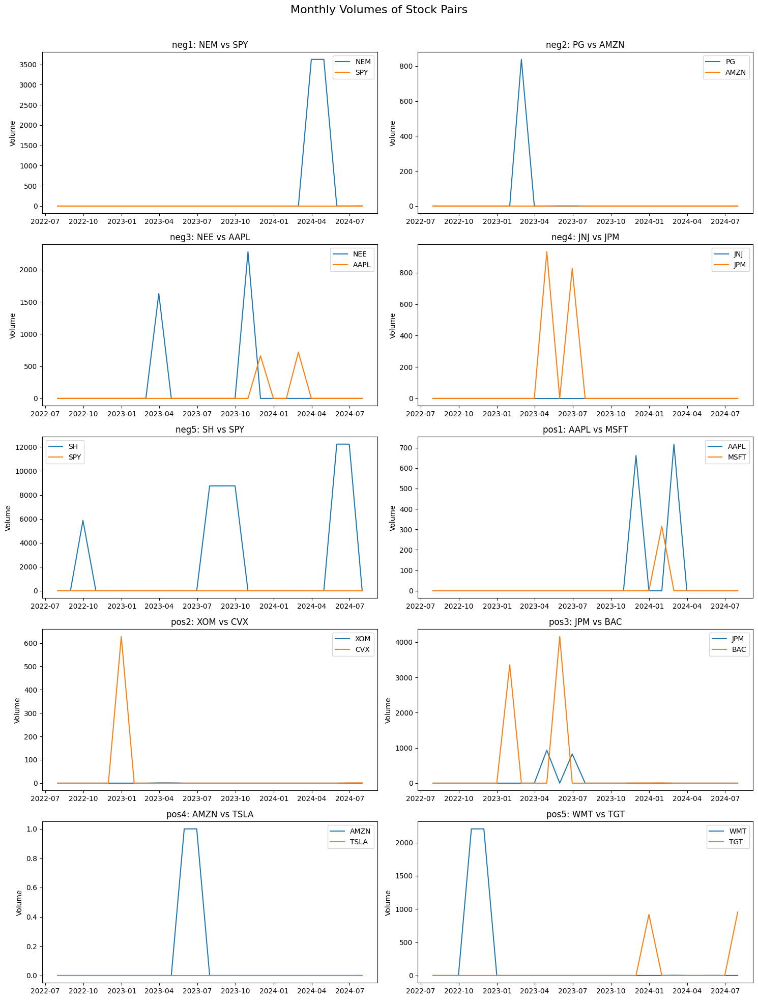

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

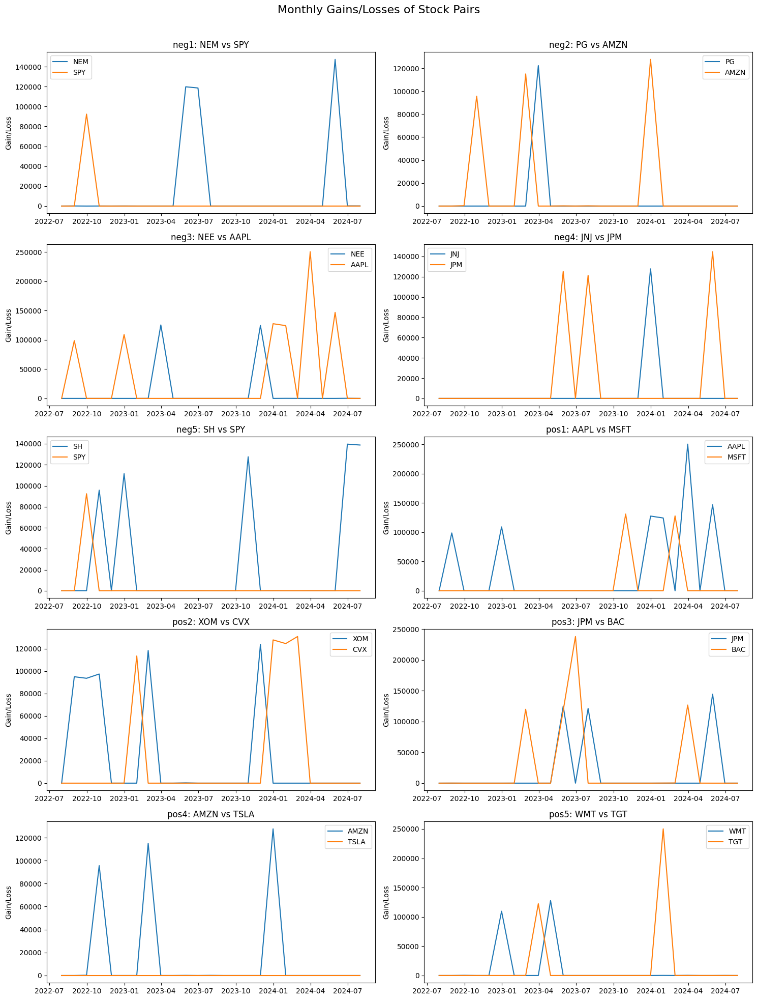

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

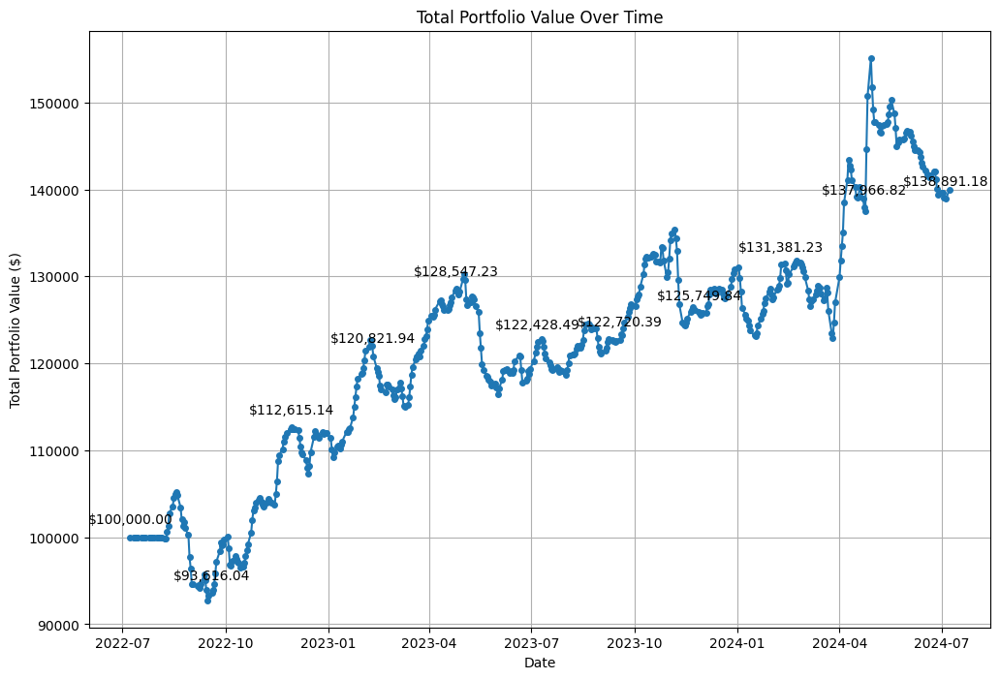

<IPython.core.display.Javascript object>


Performance Metrics:


,Total Return,Annualized Return,Annualized Volatility,Sharpe Ratio
0,0.422872,0.19368,0.216834,0.893218


In [15]:
# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Function to plot pairs
def plot_pairs(data, title, ylabel, pairs_dict):
    fig, axs = plt.subplots(5, 2, figsize=(15, 20))
    fig.suptitle(title, fontsize=16)

    for i, (key, (stock1, stock2)) in enumerate(pairs_dict.items()):
        row, col = divmod(i, 2)
        if stock1 in data.index and stock2 in data.index:
            axs[row, col].plot(data.columns, data.loc[stock1], label=stock1)
            axs[row, col].plot(data.columns, data.loc[stock2], label=stock2)
            axs[row, col].set_title(f"{key}: {stock1} vs {stock2}")
            axs[row, col].set_ylabel(ylabel)
            axs[row, col].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Plotting the monthly volumes
plot_pairs(monthly_holdings, "Monthly Volumes of Stock Pairs", "Volume", pairs_for_observation)

# Plotting the monthly gains/losses
plot_pairs(monthly_gain_loss, "Monthly Gains/Losses of Stock Pairs", "Gain/Loss", pairs_for_observation)

# Function to plot total portfolio value
def plot_total_portfolio_value(portfolio_values):
    fig, ax = plt.subplots(figsize=(12, 8))

    # Smoothing the plot
    portfolio_values_smooth = portfolio_values.rolling(window=3, min_periods=1).mean()

    ax.plot(portfolio_values_smooth.index, portfolio_values_smooth, marker='o', markersize=4)

    # Determine the number of data points
    num_points = len(portfolio_values_smooth)

    # Calculate the interval for data labels (aim for approximately 10 labels)
    interval = max(1, num_points // 10)

    # Adding data labels based on calculated interval
    for i in range(0, num_points, interval):
        ax.annotate(f"${portfolio_values_smooth.iloc[i]:,.2f}", (portfolio_values_smooth.index[i], portfolio_values_smooth.iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_title('Total Portfolio Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Portfolio Value ($)')
    plt.grid(True)
    plt.show()

# Define performance evaluation function
def evaluate_performance(portfolio):
    total_return = portfolio['Total Portfolio Value'].iloc[-1] / portfolio['Total Portfolio Value'].iloc[0] - 1
    annualized_return = (1 + total_return) ** (252.0 / len(portfolio)) - 1
    annualized_volatility = portfolio['Total Portfolio Value'].pct_change().std() * np.sqrt(252)
    sharpe_ratio = annualized_return / annualized_volatility

    performance = {
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility,
        'Sharpe Ratio': sharpe_ratio
    }

    return performance

# Evaluate the performance for the aggregated portfolio value
portfolio_values = portfolio_df['Total Portfolio Value']
performance_results = evaluate_performance(portfolio_df)

# Plot total portfolio value
plot_total_portfolio_value(portfolio_values)

# Create a DataFrame for performance results
performance_df = pd.DataFrame(performance_results, index=[0])
performance_df.to_csv('performance_metrics.csv')

# Display the performance results
print("\nPerformance Metrics:")
performance_df

**REAL LIFE EXAMPLES:**

* Renaissance Technologies, founded by Jim Simons, is one of the most famous hedge funds that have used quantitative and momentum trading strategies to achieve outstanding returns. Their flagship Medallion Fund uses sophisticated mathematical models and algorithms to identify trading opportunities, including momentum signals. The Medallion Fund has reportedly generated average annual returns of around 66% before fees since its inception in 1988

> Refences: https://www.institutionalinvestor.com/article/2bswymr8cih3jeaslxc00/portfolio/famed-medallion-fund-stretches-explanation-to-the-limit-professor-claims


* AQR (Applied Quantitative Research) Capital Management, co-founded by Cliff Asness, is a prominent asset management firm that employs quantitative trading strategies, including momentum. AQR's various funds have seen substantial success, with the firm's assets under management (AUM) growing to around $185 billion at its peak. AQR’s momentum strategies, such as the AQR Momentum Fund, have had varying performance, with some periods showing double-digit annual returns

> Refences: https://www.aqr.com/-/media/AQR/Documents/Insights/White-Papers/The-Case-for-Momentum-Investing.pdf

---
---


## SOTA Strategy #3 - Statistical Arbitrage

Statistical arbitrage is a trading strategy that aims to exploit the statistical mispricing of one or more assets. It is a market-neutral strategy that seeks to generate profits by taking advantage of the mean-reverting behavior of asset prices. Here are some of the key concepts involved in statistical arbitrage algorithmic trading:

> Market Neutrality: A market-neutral strategy aims to eliminate market risk by taking offsetting long and short positions in related assets

> Pairs Trading: Involves trading two correlated securities, buying the underperforming one and shorting the outperforming one

> Z-Score: A measure of how far a data point is from the mean in terms of standard deviations. We calculate the z-score of the price spread to identify trading signals. A high positive or negative z-score indicates a significant deviation from the mean

---

For our example, we have implemented a toned down version of the pairs trading strategy due to resource constraints.

Strategy Definition (different from before):

* The price spread between the two stocks will revert to its historical mean over time
* The price spread between the two stocks is stationary, meaning its statistical properties (mean, variance) do not change over time
* The two stocks in a pair are highly correlated or cointegrated, indicating a stable, long-term relationship
* The stocks being traded are sufficiently liquid, and the transaction costs (including slippage) are low enough to allow the strategy to be profitable
* The strategy assumes that the positions should be exited when the z-score is between -0.25 and 0.25, indicating the spread has reverted close to its mean

---

ASSUMPTIONS:

1. We assume we have an Initial Capital of $100,000
2. The strategy trades a fixed number of 10 shares per signal
3. The strategy assumes trading a fixed number of shares per signal and imposes a maximum position size to manage risk. Like here, the maximum position size for any stock is limited to 10 shares
4. The trades are executed promptly when signals are generated, without significant delays
5. The model assumes a fixed transaction cost (0.001 or 0.1%) and does not account for varying slippage or market impact based on trade size
6. The window size of 40 days is chosen based on the assumption that it provides a sufficient historical period to capture the mean-reverting behavior of the price spread

In [16]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Function to calculate z-score
def zscore(series):
    return (series - series.mean()) / series.std()

# Function to generate pairs trading signals
def generate_pairs_signals(stock1, stock2, window):
    spread = price_df[stock1] - price_df[stock2]
    zscore_spread = zscore(spread.rolling(window=window).mean().dropna())

    signals = pd.DataFrame(index=zscore_spread.index)
    signals['zscore'] = zscore_spread
    signals['long'] = (signals['zscore'] <= -2).astype(int)
    signals['short'] = (signals['zscore'] >= 2).astype(int)
    signals['exit'] = ((signals['zscore'] > -0.25) & (signals['zscore'] < 0.25)).astype(int)

    return signals

# Backtesting the Strategy with transaction cost and slippage
def backtest_pairs_strategy(prices, signals, initial_capital, transaction_cost=0.001, fixed_shares=10, max_position_size=10):
    cash = initial_capital
    holdings = {stock: 0 for stock in prices.columns}
    portfolio_value = initial_capital

    portfolio_history = []
    holdings_history = []
    gain_loss_history = []

    for date in prices.index:
        if date in signals.index:
            daily_signals = signals.loc[date]

            if isinstance(daily_signals, pd.Series):
                daily_signals = daily_signals.to_frame().T

            for pair in daily_signals.columns.levels[0]:
                signal = daily_signals[pair].iloc[0]
                stock1, stock2 = pair.split('_')

                if signal['long'] == 1 and abs(holdings[stock1]) < max_position_size and abs(holdings[stock2]) < max_position_size:
                    if cash > fixed_shares * prices.loc[date, stock1] * (1 + transaction_cost):
                        buy_amount = fixed_shares * prices.loc[date, stock1]
                        short_amount = fixed_shares * prices.loc[date, stock2]

                        cash -= buy_amount * (1 + transaction_cost)
                        cash += short_amount * (1 - transaction_cost)

                        holdings[stock1] += fixed_shares
                        holdings[stock2] -= fixed_shares

                elif signal['short'] == 1 and abs(holdings[stock1]) < max_position_size and abs(holdings[stock2]) < max_position_size:
                    if cash > fixed_shares * prices.loc[date, stock2] * (1 + transaction_cost):
                        short_amount = fixed_shares * prices.loc[date, stock1]
                        buy_amount = fixed_shares * prices.loc[date, stock2]

                        cash += short_amount * (1 - transaction_cost)
                        cash -= buy_amount * (1 + transaction_cost)

                        holdings[stock1] -= fixed_shares
                        holdings[stock2] += fixed_shares

                elif signal['exit'] == 1:
                    if holdings[stock1] > 0:
                        sell_amount = holdings[stock1] * prices.loc[date, stock1]
                        cash += sell_amount * (1 - transaction_cost)
                        holdings[stock1] = 0

                    if holdings[stock1] < 0:
                        buy_amount = abs(holdings[stock1]) * prices.loc[date, stock1]
                        cash -= buy_amount * (1 + transaction_cost)
                        holdings[stock1] = 0

                    if holdings[stock2] > 0:
                        sell_amount = holdings[stock2] * prices.loc[date, stock2]
                        cash += sell_amount * (1 - transaction_cost)
                        holdings[stock2] = 0

                    if holdings[stock2] < 0:
                        buy_amount = abs(holdings[stock2]) * prices.loc[date, stock2]
                        cash -= buy_amount * (1 + transaction_cost)
                        holdings[stock2] = 0

        portfolio_value = cash + sum(holdings[stock] * prices.loc[date, stock] for stock in holdings)
        portfolio_history.append(portfolio_value)
        holdings_history.append(holdings.copy())
        gain_loss_history.append({stock: holdings[stock] * prices.loc[date, stock] for stock in holdings})

    portfolio_df = pd.DataFrame(portfolio_history, index=prices.index, columns=['Total Portfolio Value'])
    holdings_df = pd.DataFrame(holdings_history, index=prices.index)
    gain_loss_df = pd.DataFrame(gain_loss_history, index=prices.index)

    return portfolio_df, holdings_df, gain_loss_df

# Parameters
window = 40
initial_capital = 100000
fixed_shares = 10
max_position_size = 10

# Generate signals for all pairs of stocks
all_pairs = list(combinations(price_df.columns, 2))
all_signals = []

for stock1, stock2 in all_pairs:
    pair_signals = generate_pairs_signals(stock1, stock2, window)
    pair_signals.columns = pd.MultiIndex.from_product([[stock1 + '_' + stock2], pair_signals.columns])
    all_signals.append(pair_signals)

# Combine signals into a single DataFrame
combined_signals = pd.concat(all_signals, axis=1)
combined_signals.columns.names = ['pair', 'signal']

# Backtest the strategy
portfolio_df, holdings_df, gain_loss_df = backtest_pairs_strategy(price_df, combined_signals, initial_capital, fixed_shares=fixed_shares, max_position_size=max_position_size)

# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Display results
print("Monthly Aggregated Holdings Table:")
print(monthly_holdings)
print("\nMonthly Aggregated Gain/Loss Table:")
monthly_gain_loss

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Monthly Aggregated Holdings Table:
Date  2022-07-31  2022-08-31  2022-09-30  2022-10-31  2022-11-30  2022-12-31  \
AAPL           0           0           0           0           0           0   
AMZN           0           0           0           0           0           0   
BAC            0           0           0         -10           0           0   
CVX            0           0          10           0           0         -10   
JNJ            0           0           0           0           0         -10   
JPM            0           0           0          10           0           0   
MSFT           0           0           0           0           0           0   
NEE            0           0           0           0           0           0   
NEM            0           0           0           0           0           0   
PG             0           0           0          10          10           0   
SH             0           0           0           0           0           0   
SPY  

Date,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28,2023-03-31,2023-04-30,...,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31
AAPL,0.0,0.0,0.000000,0.000000,0.000000,0.000000,23391.299896,28683.999939,13501.100006,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
AMZN,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,-25198.600006,-40518.800201,-35356.000061,-9944.899902
BAC,0.0,0.0,-334.700012,-5624.800034,-2937.400017,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,-1128.199997,-1491.799965,0.000000,-1591.199989,0.000000
CVX,0.0,0.0,14840.500031,15867.099915,0.000000,-29505.800018,-6979.300079,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
JNJ,0.0,0.0,-6553.800049,0.000000,0.000000,-5308.699951,-34394.799957,-9854.399872,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,10309.400024,27885.200043,7310.500031
JPM,0.0,0.0,0.000000,24114.499969,18422.899780,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,-15323.100128,-43499.199982,-37508.000031,-10333.174896
MSFT,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
NEE,0.0,0.0,0.000000,-1454.199982,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,7105.900002,0.000000,0.000000,0.000000
NEM,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,4268.700027,0.000000,0.000000,0.000000
PG,0.0,0.0,0.000000,10493.499985,29572.900085,5982.299957,-1539.199982,0.000000,4198.200073,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,-13387.799835,-8219.000092


In [17]:
monthly_holdings.to_csv('holding_6.csv')
monthly_gain_loss.to_csv('gain_loss_6.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

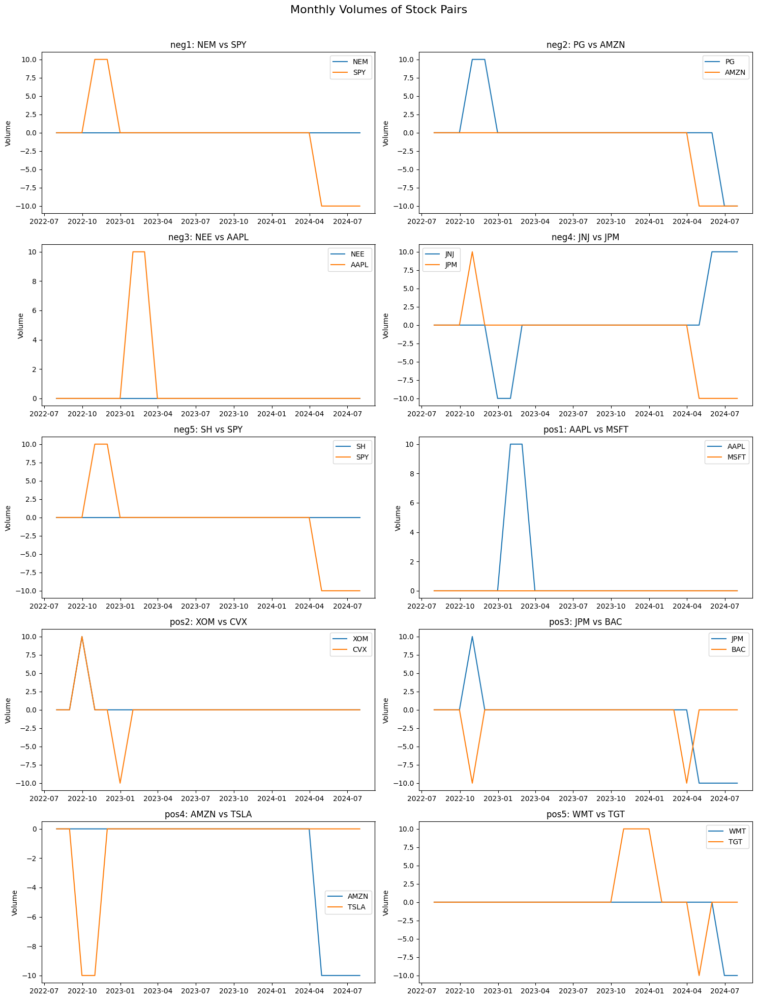

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

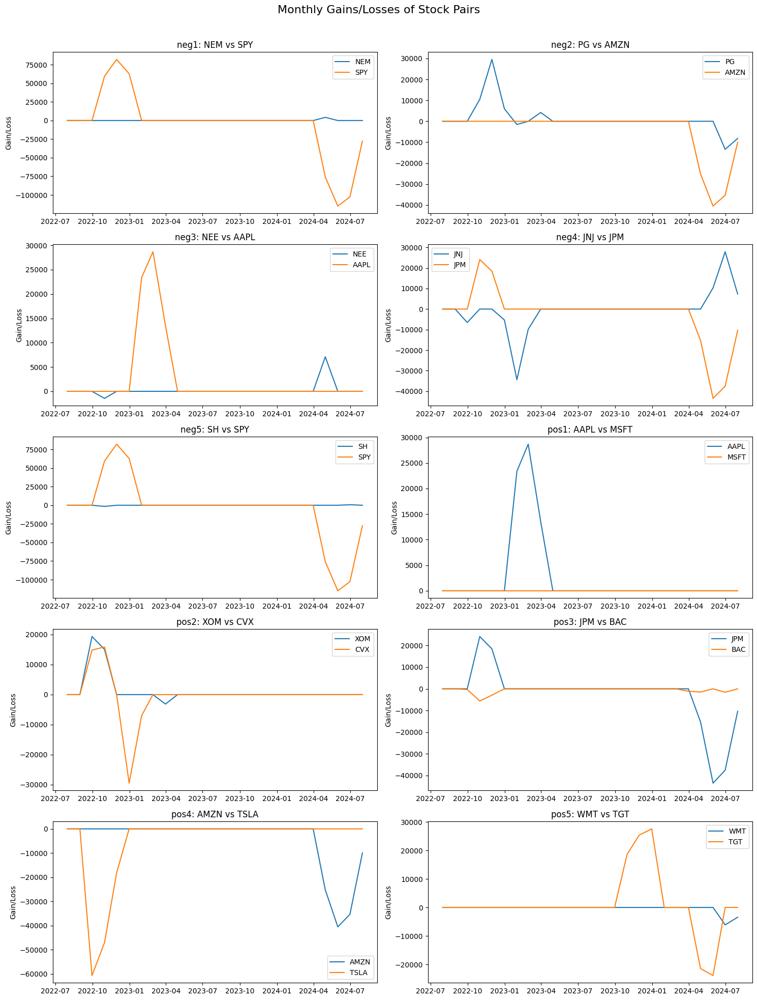

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

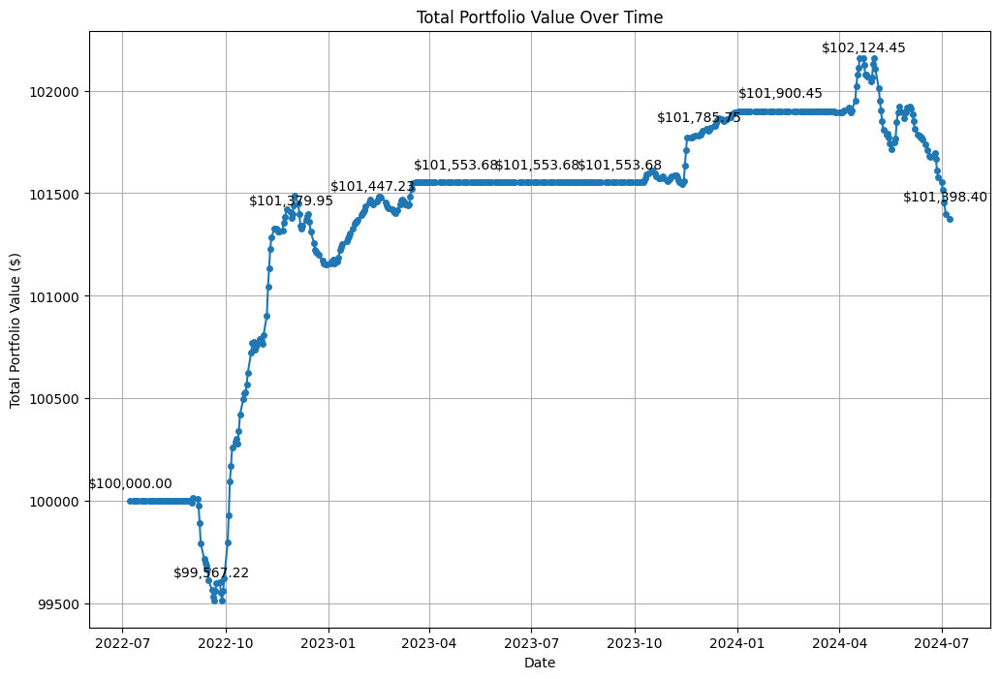

<IPython.core.display.Javascript object>


Performance Metrics:


,Total Return,Annualized Return,Annualized Volatility,Sharpe Ratio
0,0.013483,0.006746,0.006566,1.027319


In [18]:
# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Function to plot pairs
def plot_pairs(data, title, ylabel, pairs_dict):
    fig, axs = plt.subplots(5, 2, figsize=(15, 20))
    fig.suptitle(title, fontsize=16)

    for i, (key, (stock1, stock2)) in enumerate(pairs_dict.items()):
        row, col = divmod(i, 2)
        if stock1 in data.index and stock2 in data.index:
            axs[row, col].plot(data.columns, data.loc[stock1], label=stock1)
            axs[row, col].plot(data.columns, data.loc[stock2], label=stock2)
            axs[row, col].set_title(f"{key}: {stock1} vs {stock2}")
            axs[row, col].set_ylabel(ylabel)
            axs[row, col].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Plotting the monthly volumes
plot_pairs(monthly_holdings, "Monthly Volumes of Stock Pairs", "Volume", pairs_for_observation)

# Plotting the monthly gains/losses
plot_pairs(monthly_gain_loss, "Monthly Gains/Losses of Stock Pairs", "Gain/Loss", pairs_for_observation)

# Function to plot total portfolio value
def plot_total_portfolio_value(portfolio_values):
    fig, ax = plt.subplots(figsize=(12, 8))

    # Smoothing the plot
    portfolio_values_smooth = portfolio_values.rolling(window=3, min_periods=1).mean()

    ax.plot(portfolio_values_smooth.index, portfolio_values_smooth, marker='o', markersize=4)

    # Determine the number of data points
    num_points = len(portfolio_values_smooth)

    # Calculate the interval for data labels (aim for approximately 10 labels)
    interval = max(1, num_points // 10)

    # Adding data labels based on calculated interval
    for i in range(0, num_points, interval):
        ax.annotate(f"${portfolio_values_smooth.iloc[i]:,.2f}", (portfolio_values_smooth.index[i], portfolio_values_smooth.iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_title('Total Portfolio Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Portfolio Value ($)')
    plt.grid(True)
    plt.show()

# Define performance evaluation function
def evaluate_performance(portfolio):
    total_return = portfolio['Total Portfolio Value'].iloc[-1] / portfolio['Total Portfolio Value'].iloc[0] - 1
    annualized_return = (1 + total_return) ** (252.0 / len(portfolio)) - 1
    annualized_volatility = portfolio['Total Portfolio Value'].pct_change().std() * np.sqrt(252)
    sharpe_ratio = annualized_return / annualized_volatility

    performance = {
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility,
        'Sharpe Ratio': sharpe_ratio
    }

    return performance

# Evaluate the performance for the aggregated portfolio value
portfolio_values = portfolio_df['Total Portfolio Value']
performance_results = evaluate_performance(portfolio_df)

# Plot total portfolio value
plot_total_portfolio_value(portfolio_values)

# Create a DataFrame for performance results
performance_df = pd.DataFrame(performance_results, index=[0])
performance_df.to_csv('performance_metrics.csv')

# Display the performance results
print("\nPerformance Metrics:")
performance_df

**REAL LIFE EXAMPLES:**

* Two Sigma is a leading quantitative hedge fund that employs statistical arbitrage strategies. As of recent reports, Two Sigma manages around $60 billion in assets and has consistently delivered strong returns. Specific annual gains vary, but the firm has produced double-digit annual returns, resulting in billions of dollars in profit over its history

> Refences: https://trendspider.com/learning-center/two-sigma-investments/


* D.E. Shaw employs a variety of quantitative strategies, including statistical arbitrage. The firm manages over $50 billion in assets and has historically generated strong returns. In certain years, such as 2020, D.E. Shaw's Composite Fund gained around 19%, amounting to gains in the billions of dollars

> Refences: https://www.institutionalinvestor.com/article/2btgiowdmfyg7ib5snvnk/portfolio/come-together-statistical-arbitrage#:~:text=According%20to%20Shaw%2C%20virtually%20all,second%20process%20involves%20risk%20management

---
---

## SOTA Strategy #4 - Mean Reversion

Mean reversion is a financial theory that posits that asset prices and historical returns will eventually revert to their long-term average levels. This concept forms the basis of mean reversion algorithmic trading strategies, which seek to capitalize on temporary deviations of asset prices from their historical averages. Here are some of its key aspects:

> Statistical Characterstics: Statistical measures play a crucial role in mean reversion strategies. The mean, or average, is the central value of a dataset, while the standard deviation measures the amount of variation or dispersion in the data. The Z-score represents the number of standard deviations a data point is from the mean. These measures help identify when an asset's price has deviated significantly from its average and may be due for a reversion

> Identifying Opportunities: Identifying mean reversion opportunities often involves using indicators like moving averages and Bollinger Bands. Moving averages smooth out price data to help identify trends and potential reversion points. Bollinger Bands, which consist of a moving average and bands set at a specified number of standard deviations above and below it, show the relative high and low of a stock price in relation to previous trades

> Indicators: Key indicators like the Relative Strength Index (RSI) and the Moving Average Convergence Divergence (MACD) are also used to identify mean reversion opportunities. The RSI measures the speed and change of price movements, helping to identify overbought or oversold conditions. The MACD shows the relationship between two moving averages of a security’s price, indicating potential reversals in trends

---

For our example, we implement and backtest a mean reversion trading strategy based on Z-score approach.

* We compute necessary statistical measures for the mean reversion strategy - like rolling mean and rolling standard deviation over a specified window, we also calculate the Z-score, which measures how many standard deviations the current price is from the rolling mean
* Here we generate trading signals based on the Z-scores. These signals are used to determine when to enter or exit trades
* The threshold determines the sensitivity of the strategy to price deviations

---

ASSUMPTIONS:

1. We assume we have an intial capital of $100,000
2. A rolling window of 20 periods is used to calculate the rolling mean and standard deviation
3. The threshold for generating buy/sell signals is set at a Z-score of 1.0
4. The code does not account for transaction costs or slippage
5. The strategy assumes that there is sufficient liquidity in the market to execute trades at the specified prices without impacting the market

In [19]:
# Load stock prices data
price_df = pd.read_csv('data_yahoo.csv', index_col=0, parse_dates=True)

# Calculate Mean Reversion Indicators
def calculate_mean_reversion_indicators(prices, window=20):
    signals = pd.DataFrame(index=prices.index)
    signals['price'] = prices
    signals['rolling_mean'] = prices.rolling(window=window, min_periods=1).mean()
    signals['rolling_std'] = prices.rolling(window=window, min_periods=1).std()
    signals['z_score'] = (signals['price'] - signals['rolling_mean']) / signals['rolling_std']
    return signals

# Generate Buy/Sell Signals based on Mean Reversion
def generate_mean_reversion_signals(signals, threshold=1.0):
    signals['signal'] = 0.0
    signals['signal'][signals['z_score'] > threshold] = -1.0  # Sell signal
    signals['signal'][signals['z_score'] < -threshold] = 1.0  # Buy signal
    signals['positions'] = signals['signal'].diff()
    return signals

# Backtesting the Strategy
def backtest_strategy(prices, signals, initial_capital):
    cash = initial_capital
    holdings = {stock: 0 for stock in prices.columns}
    portfolio_value = initial_capital

    portfolio_history = []
    holdings_history = []
    gain_loss_history = []

    for date in prices.index:
        daily_signals = signals.loc[date]
        daily_prices = prices.loc[date]

        daily_holdings = holdings.copy()

        buy_signals = daily_signals[daily_signals == 1.0].index
        sell_signals = daily_signals[daily_signals == -1.0].index

        daily_gain_loss = {stock: 0 for stock in prices.columns}

        # Sell stocks
        for stock in sell_signals:
            if holdings[stock] > 0:
                cash += holdings[stock] * daily_prices[stock]
                daily_gain_loss[stock] = holdings[stock] * daily_prices[stock]
                holdings[stock] = 0

        # Buy stocks
        for stock in buy_signals:
            if cash > 0:
                shares_to_buy = cash / daily_prices[stock]
                cash -= shares_to_buy * daily_prices[stock]
                holdings[stock] += shares_to_buy

        # Calculate portfolio value
        portfolio_value = cash + sum(holdings[stock] * daily_prices[stock] for stock in holdings)
        portfolio_history.append(portfolio_value)
        holdings_history.append(daily_holdings)
        gain_loss_history.append(daily_gain_loss)

    portfolio_df = pd.DataFrame(portfolio_history, index=prices.index, columns=['Total Portfolio Value'])
    holdings_df = pd.DataFrame(holdings_history, index=prices.index)
    gain_loss_df = pd.DataFrame(gain_loss_history, index=prices.index)

    return portfolio_df, holdings_df, gain_loss_df

# Apply the strategy to each stock
window = 20
threshold = 1.0
initial_capital = 100000

# Calculate signals for all stocks
all_signals = {stock: calculate_mean_reversion_indicators(price_df[stock], window) for stock in price_df.columns}
all_signals = {stock: generate_mean_reversion_signals(signals, threshold) for stock, signals in all_signals.items()}

# Combine signals into a single DataFrame
combined_signals = pd.DataFrame({stock: signals['positions'] for stock, signals in all_signals.items()})

# Backtest the strategy using pooled capital
portfolio_df, holdings_df, gain_loss_df = backtest_strategy(price_df, combined_signals, initial_capital)

# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Display results
print("Monthly Aggregated Holdings Table:")
print(monthly_holdings)
print("\nMonthly Aggregated Gain/Loss Table:")
monthly_gain_loss

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Monthly Aggregated Holdings Table:
Date   2022-07-31  2022-08-31  2022-09-30   2022-10-31  2022-11-30  \
AAPL     0.000000  615.555312  676.990367     0.000000     0.00000   
AMZN     0.000000    0.000000    0.000000     0.000000     0.00000   
BAC   3015.921323    0.000000    0.000000     0.000000     0.00000   
CVX      0.000000    0.000000    0.000000     0.000000     0.00000   
JNJ      0.000000    0.000000    0.000000     0.000000   637.04989   
JPM      0.000000    0.000000    0.000000     0.000000     0.00000   
MSFT     0.000000    0.000000    0.000000     0.000000     0.00000   
NEE      0.000000    0.000000    0.000000     0.000000     0.00000   
NEM      0.000000    0.000000    0.000000     0.000000     0.00000   
PG       0.000000    0.000000    0.000000     0.000000     0.00000   
SH       0.000000    0.000000    0.000000  6257.917757     0.00000   
SPY      0.000000    0.000000    0.000000     0.000000     0.00000   
TGT      0.000000    0.000000    0.000000     0.000000 

Date,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28,2023-03-31,2023-04-30,...,2023-10-31,2023-11-30,2023-12-31,2024-01-31,2024-02-29,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31
AAPL,0.000000,0.000000e+00,396391.592430,203978.741575,206342.147423,0.000000,0.000000,135244.627375,0.000000,0.000000,...,0.000000,0.000000,0.000000,182506.790396,180837.648720,0.000000,197853.612534,0.000000,202875.007968,0.000000
AMZN,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,118636.525152,0.000000,310269.007204,334040.636663,...,163788.967606,184191.582457,376483.547768,181818.602010,0.000000,383343.730209,0.000000,0.000000,194489.655647,0.000000
BAC,101968.304069,1.060821e+05,0.000000,0.000000,0.000000,0.000000,121750.187804,0.000000,0.000000,163421.993112,...,170266.119158,179538.283597,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,397839.628462,0.000000
CVX,99085.801692,1.565123e-11,0.000000,0.000000,112178.112760,113736.896322,127671.804314,0.000000,296098.974148,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,197301.090184,0.000000,0.000000,196703.089613,0.000000
JNJ,0.000000,1.105930e-12,100551.227072,99409.217076,113394.880382,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,361322.407089,0.000000,0.000000,200165.140792,195089.229194,0.000000
JPM,0.000000,0.000000e+00,0.000000,0.000000,109314.531263,0.000000,0.000000,0.000000,0.000000,0.000000,...,165304.162851,0.000000,0.000000,0.000000,0.000000,190799.785776,0.000000,0.000000,0.000000,0.000000
MSFT,0.000000,0.000000e+00,0.000000,0.000000,0.000000,113281.009175,0.000000,0.000000,0.000000,0.000000,...,175157.710426,0.000000,0.000000,0.000000,0.000000,0.000000,198896.824945,0.000000,0.000000,0.000000
NEE,99362.755035,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,156479.579859,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
NEM,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,127813.315424,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,182945.180776,0.000000,0.000000,0.000000,0.000000,0.000000
PG,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,166680.875767,366889.167247,0.000000,0.000000,0.000000,184878.907711,0.000000,0.000000,197395.247446,0.000000


In [20]:
monthly_holdings.to_csv('holding_7.csv')
monthly_gain_loss.to_csv('gain_loss_7.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

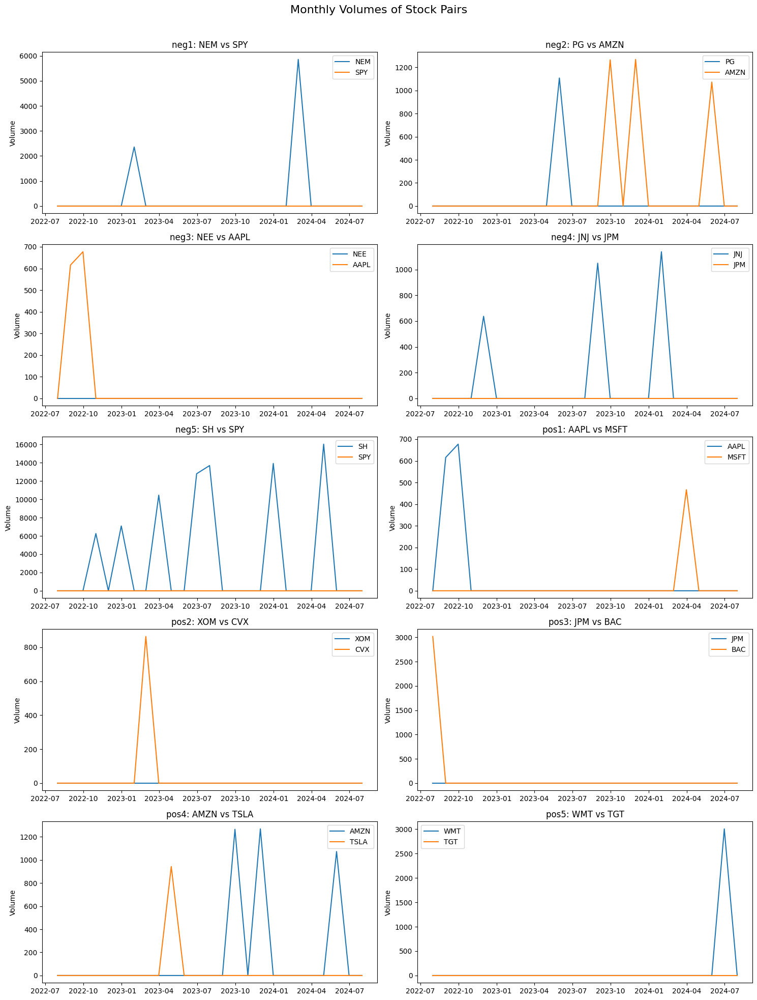

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

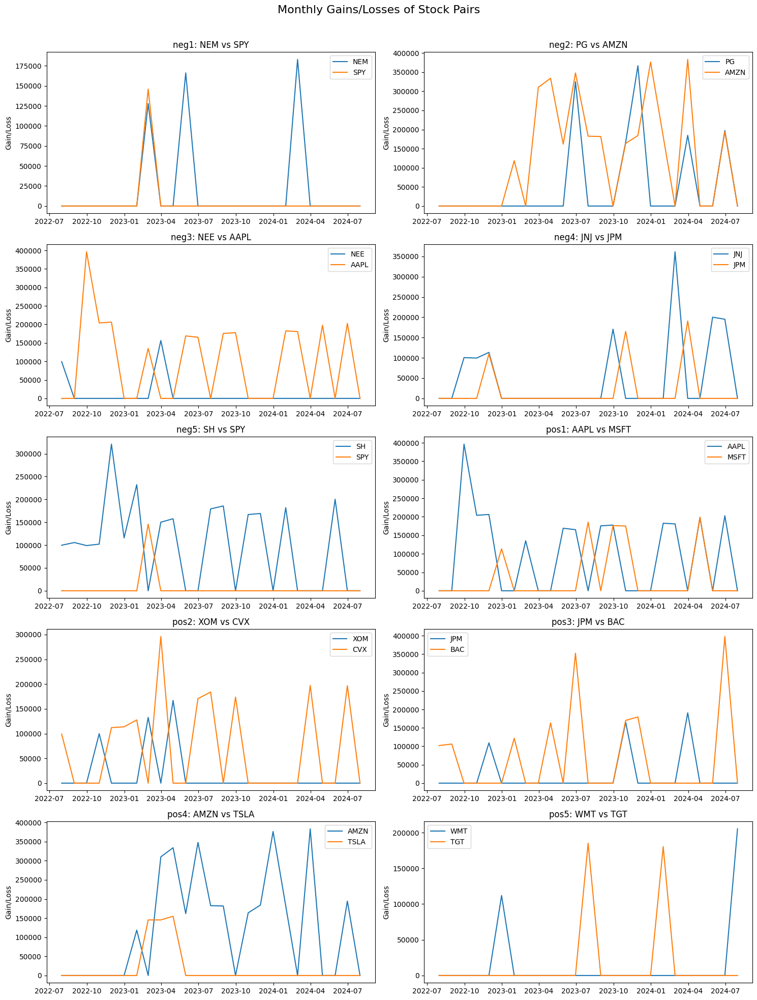

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

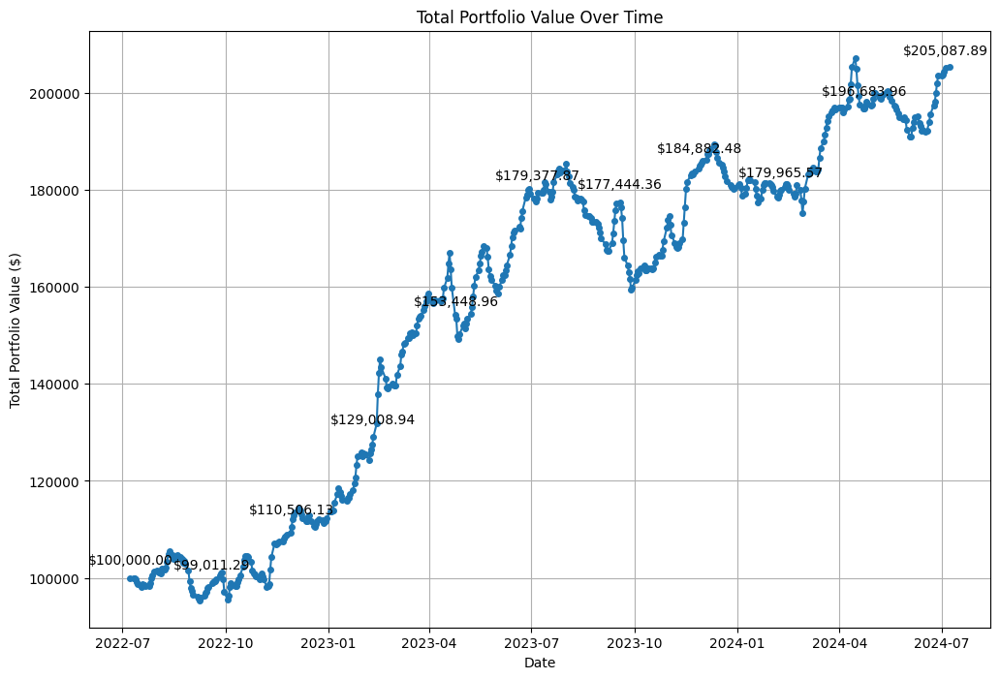

<IPython.core.display.Javascript object>


Performance Metrics:


,Total Return,Annualized Return,Annualized Volatility,Sharpe Ratio
0,1.052583,0.434738,0.240371,1.808614


In [21]:
# Resample the data to monthly frequency
monthly_holdings = holdings_df.resample('M').last().fillna(0).T
monthly_gain_loss = gain_loss_df.resample('M').sum().fillna(0).T

# Function to plot pairs
def plot_pairs(data, title, ylabel, pairs_dict):
    fig, axs = plt.subplots(5, 2, figsize=(15, 20))
    fig.suptitle(title, fontsize=16)

    for i, (key, (stock1, stock2)) in enumerate(pairs_dict.items()):
        row, col = divmod(i, 2)
        if stock1 in data.index and stock2 in data.index:
            axs[row, col].plot(data.columns, data.loc[stock1], label=stock1)
            axs[row, col].plot(data.columns, data.loc[stock2], label=stock2)
            axs[row, col].set_title(f"{key}: {stock1} vs {stock2}")
            axs[row, col].set_ylabel(ylabel)
            axs[row, col].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Plotting the monthly volumes
plot_pairs(monthly_holdings, "Monthly Volumes of Stock Pairs", "Volume", pairs_for_observation)

# Plotting the monthly gains/losses
plot_pairs(monthly_gain_loss, "Monthly Gains/Losses of Stock Pairs", "Gain/Loss", pairs_for_observation)

# Function to plot total portfolio value
def plot_total_portfolio_value(portfolio_values):
    fig, ax = plt.subplots(figsize=(12, 8))

    # Smoothing the plot
    portfolio_values_smooth = portfolio_values.rolling(window=3, min_periods=1).mean()

    ax.plot(portfolio_values_smooth.index, portfolio_values_smooth, marker='o', markersize=4)

    # Determine the number of data points
    num_points = len(portfolio_values_smooth)

    # Calculate the interval for data labels (aim for approximately 10 labels)
    interval = max(1, num_points // 10)

    # Adding data labels based on calculated interval
    for i in range(0, num_points, interval):
        ax.annotate(f"${portfolio_values_smooth.iloc[i]:,.2f}", (portfolio_values_smooth.index[i], portfolio_values_smooth.iloc[i]), textcoords="offset points", xytext=(0,10), ha='center')

    ax.set_title('Total Portfolio Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Total Portfolio Value ($)')
    plt.grid(True)
    plt.show()

# Define performance evaluation function
def evaluate_performance(portfolio):
    total_return = portfolio['Total Portfolio Value'].iloc[-1] / portfolio['Total Portfolio Value'].iloc[0] - 1
    annualized_return = (1 + total_return) ** (252.0 / len(portfolio)) - 1
    annualized_volatility = portfolio['Total Portfolio Value'].pct_change().std() * np.sqrt(252)
    sharpe_ratio = annualized_return / annualized_volatility

    performance = {
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Annualized Volatility': annualized_volatility,
        'Sharpe Ratio': sharpe_ratio
    }

    return performance

# Evaluate the performance for the aggregated portfolio value
portfolio_values = portfolio_df['Total Portfolio Value']
performance_results = evaluate_performance(portfolio_df)

# Plot total portfolio value
plot_total_portfolio_value(portfolio_values)

# Create a DataFrame for performance results
performance_df = pd.DataFrame(performance_results, index=[0])
performance_df.to_csv('performance_metrics.csv')

# Display the performance results
print("\nPerformance Metrics:")
performance_df

**REAL LIFE EXAMPLES:**

* Bridgewater Associates, founded by Ray Dalio, is the world's largest hedge fund and employs a variety of strategies, including mean reversion, in its Pure Alpha fund. The Pure Alpha fund has delivered an annualized return of about 12% since its inception in 1991. By 2020, Bridgewater's Pure Alpha fund had generated over $45 billion in gains since inception

> Refences: https://iknowfirst.com/rsar-ai-hedge-fund-bridgewater-using-ai-to-increase-profits-and-productivity

* Two Sigma Investments is another prominent hedge fund known for its data-driven and algorithmic trading strategies, including mean reversion. Two Sigma's Absolute Return Fund, which employs a variety of quantitative strategies including mean reversion, has delivered strong returns. For example, in 2016, the fund returned approximately 8.5%. By 2020, Two Sigma had grown to manage over $58 billion in assets under management (AUM), generating substantial profits for the firm and its investors

> Refences: https://www.businessinsider.com/hedge-fund-returns-for-two-sigma-spectrum-absolute-return-funds-2024-1

---
---

## Other SOTA Techniques

Apart from the algorithms discussed above, several state-of-the-art algorithms have historically demonstrated significant gains. Here are some of them, listed:

> **Machine Learning and AI-Based Algorithms:**

* Reinforcement Learning: Algorithms learn optimal trading strategies by interacting with the market environment

* Deep Learning Models: Such as LSTM (Long Short-Term Memory) networks for predicting future price movements based on historical data

* Ex. Two Sigma utilizes machine learning and AI to analyze large datasets for trading decisions, managing over $58 billion in assets (ref. https://www.twosigma.com/articles/machine-learning-models-of-financial-data/)


> **Quantitative Factor Models:**

* Multi-Factor Models: Combine various factors such as value, momentum, and quality to select stocks

* Smart Beta: Strategies that use alternative weighting schemes based on factors like volatility or dividend yield

* Ex. Renaissance Technologies' Medallion Fund is known for its use of quantitative models and has generated returns of about 66% annually before fees from 1988 to 2018 (ref. https://quartr.com/insights/company-research/renaissance-technologies-and-the-medallion-fund)

> **Arbitrage Strategies:**

* Convertible Arbitrage: Involves buying convertible bonds and shorting the underlying stock

* Event-Driven Arbitrage: Trading based on corporate events such as mergers, acquisitions, or earnings announcements

* Ex. Citadel employs a variety of arbitrage strategies, including convertible and event-driven arbitrage (ref. https://www.institutionalinvestor.com/article/2btfmc4i914x7pya9zwg0/home/boy-wonder)


> **Volatility Trading:**

* VIX Futures Trading: Involves trading futures based on the VIX, a measure of market volatility

* Straddle and Strangle Options Strategies: Buying both call and put options to profit from significant price movements in either direction

* Ex. SAC Capital (now Point72) is known for using volatility trading strategies among others. In 2006, SAC Capital generated over $1 billion in profits (ref. https://www.bloomberg.com/news/articles/2024-03-13/cohen-s-point72-shuns-new-cash-with-assets-at-record-32-billion)

> **Sentiment Analysis-Based Algorithms:**

* News-Based Trading: Uses natural language processing (NLP) to analyze news articles and social media to predict market movements

* Social Media Sentiment: Trading based on sentiment analysis from platforms like Twitter (now X) or Reddit

* Ex. Kensho Technologies (owned by S&P Global) uses sentiment analysis and NLP for trading insights (ref. https://www.prnewswire.com/news-releases/kensho-technologies-launches-a-natural-language-processing-solution-that-conceptually-understands-and-classifies-documents-301760266.html)


> **Genetic Algorithms:**

* Evolutionary Computation: Uses techniques inspired by natural evolution, such as mutation, crossover, and selection, to optimize trading strategies

* Ex. D.E.Shaw Group employs various advanced algorithms, including genetic algorithms, managing over $50 billion in assets (ref. https://www.marketwatch.com/story/can-ai-and-a-supercomputer-beat-the-markets-this-is-one-of-the-hedge-funds-trying-to-find-out-25283664)